# Business Case : 
"The House Price Prediction project uses machine learning to estimate property prices based on key real estate factors, helping stakeholders make informed decisions."

## Domain Analysis
The real estate market is influenced by various factors such as location, property type, neighborhood, market trends, and economic conditions. House prices are driven by supply and demand, interest rates, infrastructure developments, and demographic shifts. This project leverages machine learning to predict house prices based on historical data and key property attributes like zoning classification, building type, and sale condition. Accurate predictions can help buyers, sellers, real estate agents, and investors make data-driven decisions, improving market efficiency and pricing transparency. Future enhancements could incorporate economic indicators, mortgage rates, and external real estate data for better predictive accuracy.

Key Effects of House Price Prediction Model

1. Better Decision-Making – Helps buyers, sellers, and real estate agents make informed pricing and investment decisions.

2. Market Transparency – Reduces pricing uncertainty by providing data-driven insights into fair property values.

3. Investment Optimization – Assists real estate investors in identifying profitable properties based on past trends and future predictions.

4. Improved Affordability Planning – Helps homebuyers assess whether a property aligns with their budget and future financial planning.

5. Economic Impact – Affects housing policies, mortgage approvals, and lending institutions, influencing the overall housing economy.

6. Scalability for Expansion – The model can be extended to predict rental prices, commercial properties, or even future real estate market trends.

7. Integration with Smart Technologies – Can be integrated with real estate platforms, smart applications, and automated valuation tools for seamless real-world implementation.

By leveraging machine learning, this model enhances efficiency, accuracy, and accessibility in real estate pricing, making the housing market more predictable and data-driven.

In [ ]:
# Importing Libraries

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings('ignore')

In [4]:
df = pd.read_csv('data.csv')

In [5]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
df.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [8]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [9]:
df.describe(include='O')

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,...,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,...,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,...,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1151,1454,50,925,1311,1459,1052,1382,225,1260,...,870,605,1311,1326,1340,3,157,49,1267,1198


## Exploratory Data Analysis(EDA)

### - Univariate Analysis

In [12]:
#The Sweetviz library is used for automated EDA (Exploratory Data Analysis) in Python.It generates detailed visual reports to help you quickly
# understand dataset distributions.It is used for univariate analysis.

In [219]:
import sweetviz as sv
report = sv.analyze(df)
report.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [14]:
if 'Id' in df.columns:
    df.drop(columns=['Id'], inplace=True)

In [15]:
# Select numerical and categorical columns separately
numeric_cols = df.select_dtypes(include=[np.number]).columns
categorical_cols = df.select_dtypes(include=['object']).columns

Plotting histogram for: MSSubClass


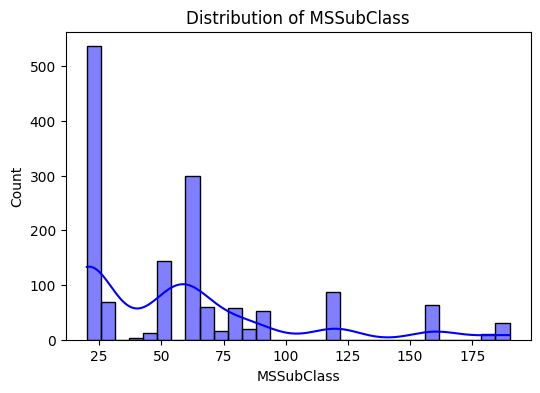

Plotting histogram for: LotFrontage


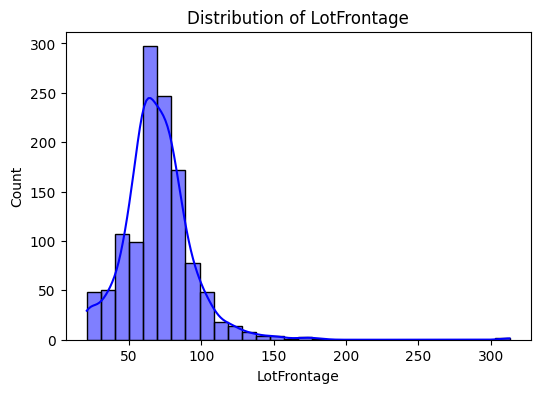

Plotting histogram for: LotArea


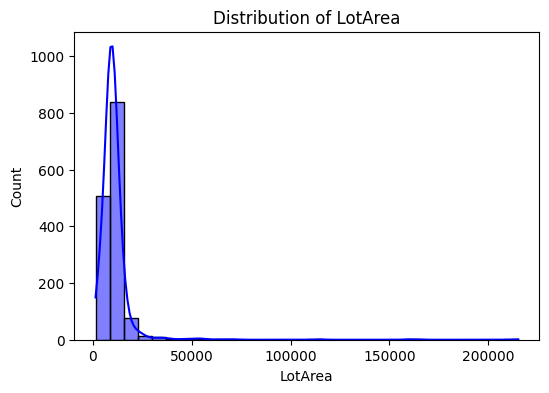

Plotting histogram for: OverallQual


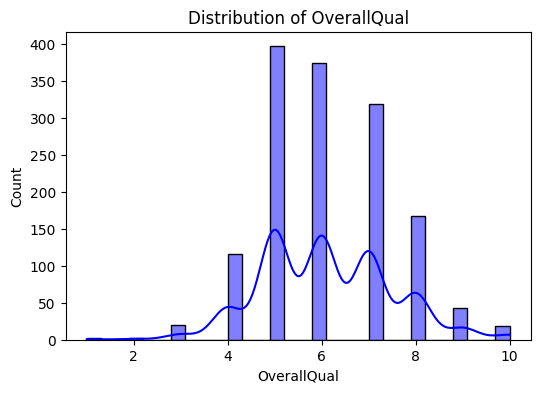

Plotting histogram for: OverallCond


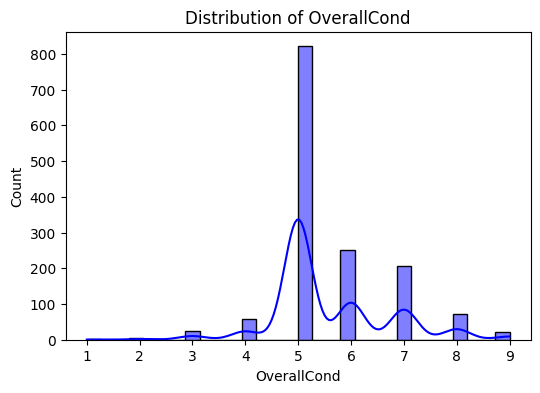

Plotting histogram for: YearBuilt


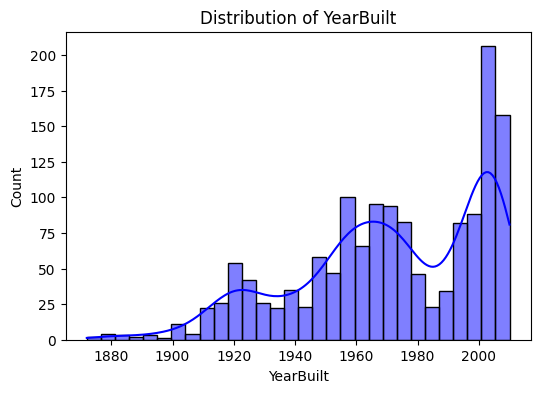

Plotting histogram for: YearRemodAdd


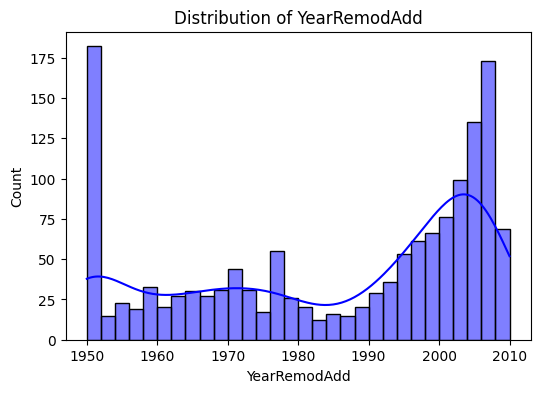

Plotting histogram for: MasVnrArea


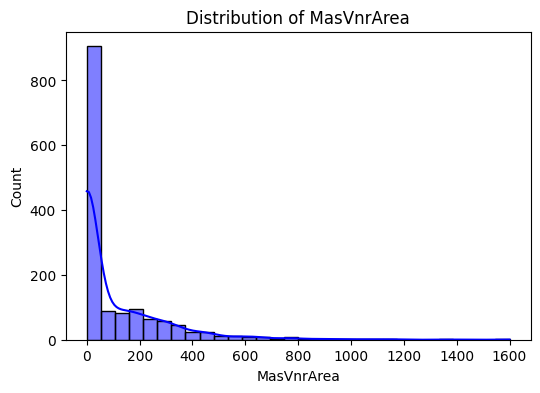

Plotting histogram for: BsmtFinSF1


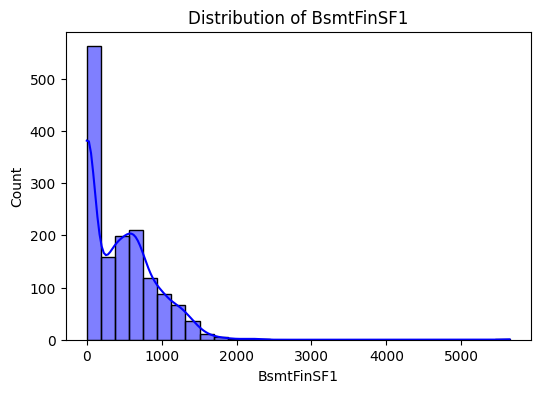

Plotting histogram for: BsmtFinSF2


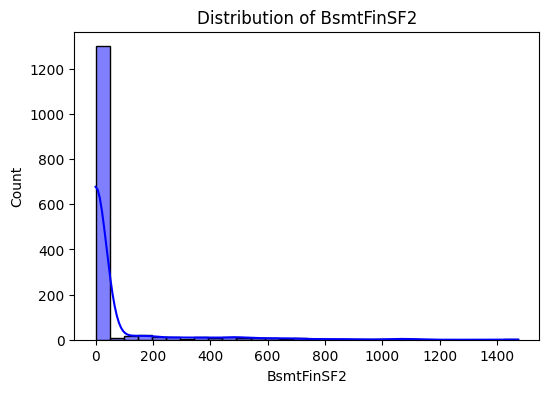

Plotting histogram for: BsmtUnfSF


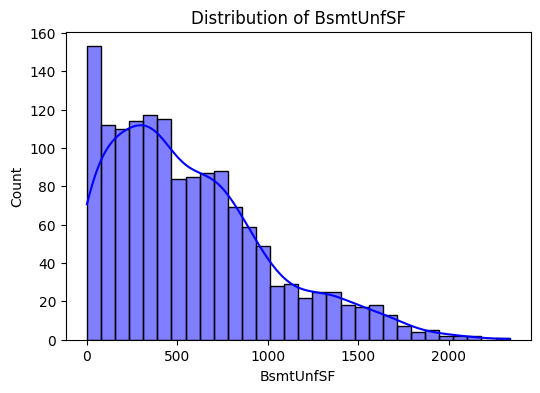

Plotting histogram for: TotalBsmtSF


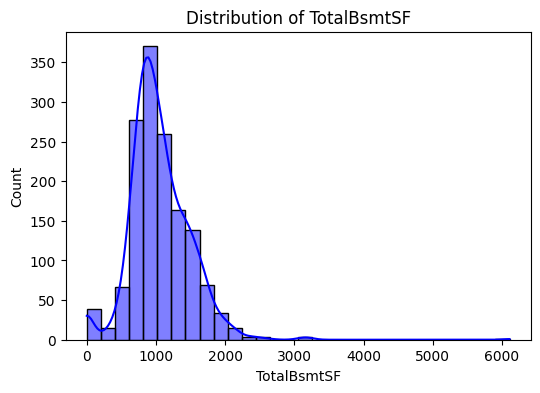

Plotting histogram for: 1stFlrSF


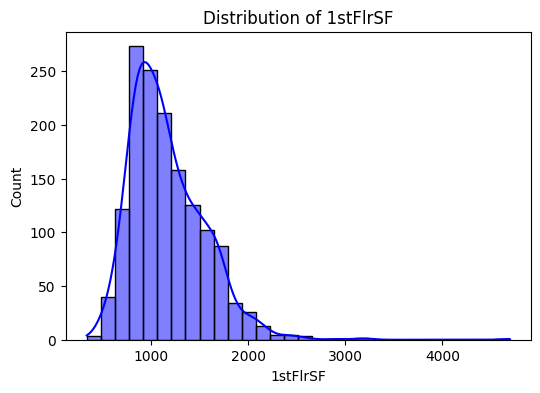

Plotting histogram for: 2ndFlrSF


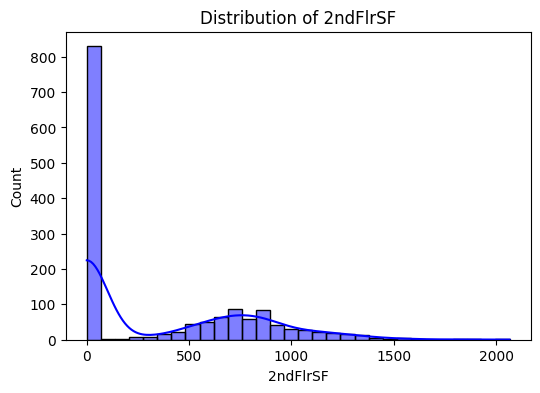

Plotting histogram for: LowQualFinSF


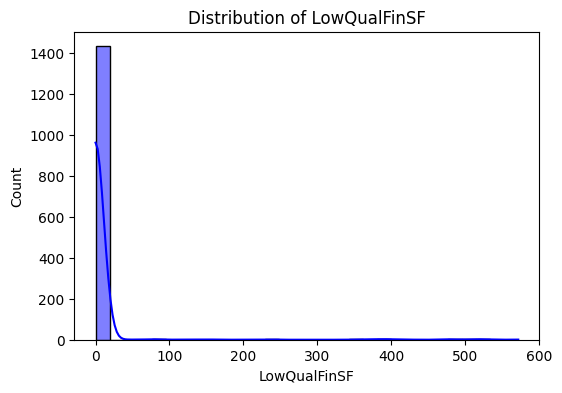

Plotting histogram for: GrLivArea


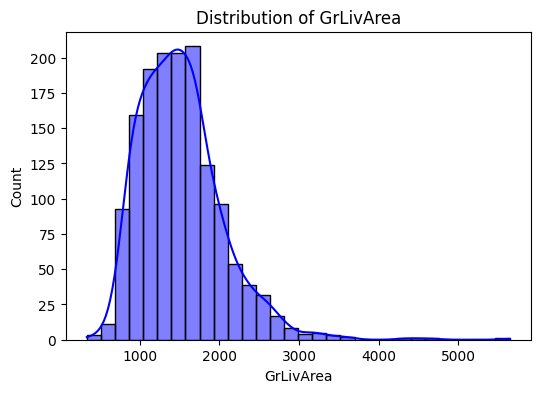

Plotting histogram for: BsmtFullBath


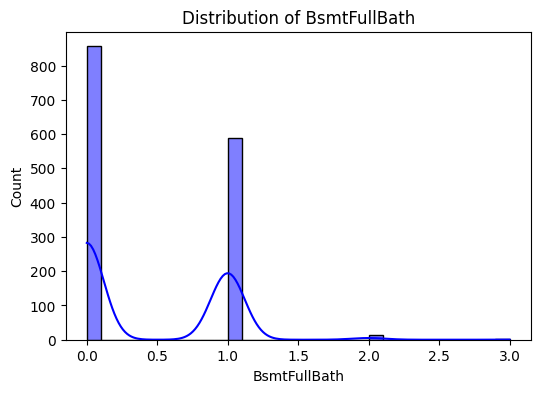

Plotting histogram for: BsmtHalfBath


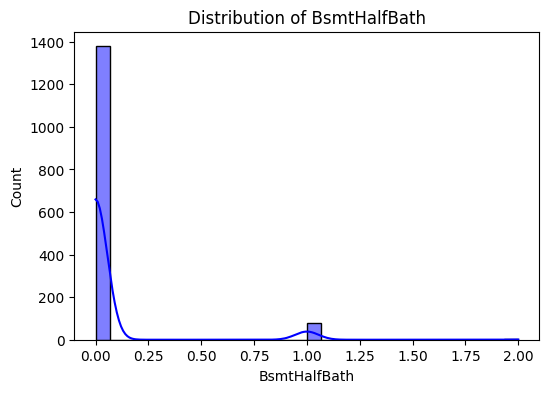

Plotting histogram for: FullBath


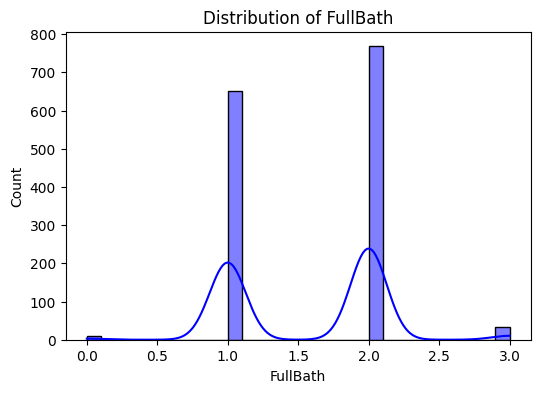

Plotting histogram for: HalfBath


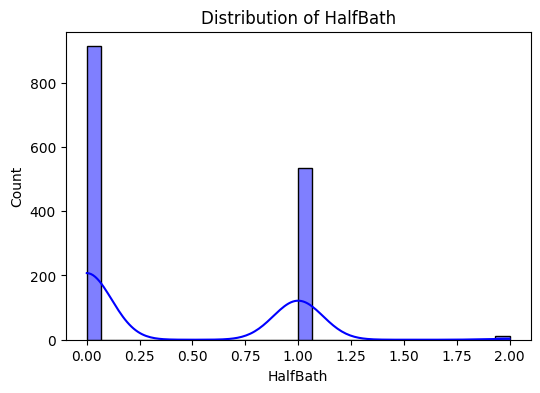

Plotting histogram for: BedroomAbvGr


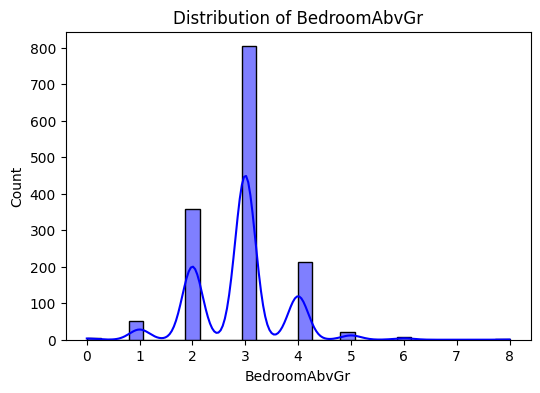

Plotting histogram for: KitchenAbvGr


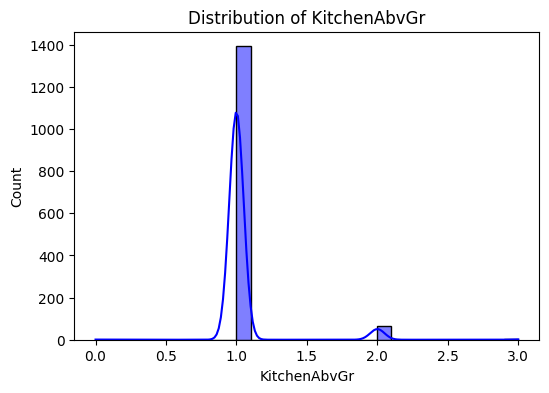

Plotting histogram for: TotRmsAbvGrd


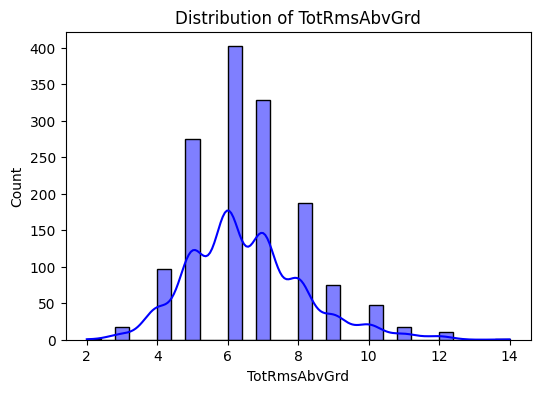

Plotting histogram for: Fireplaces


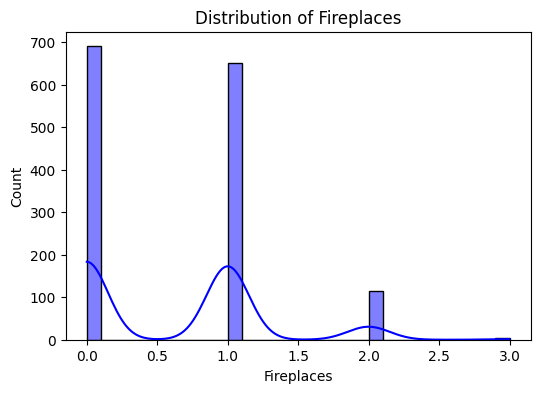

Plotting histogram for: GarageYrBlt


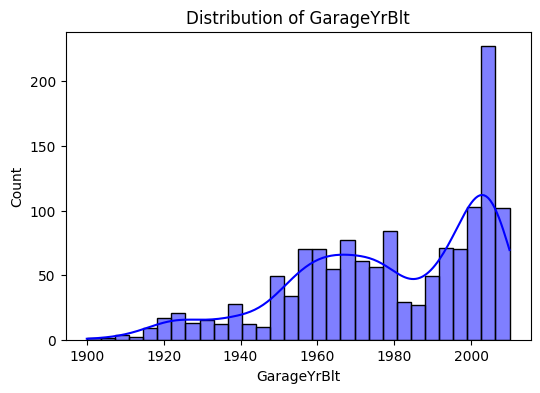

Plotting histogram for: GarageCars


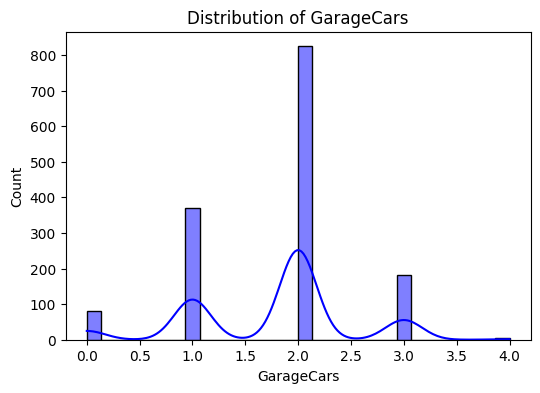

Plotting histogram for: GarageArea


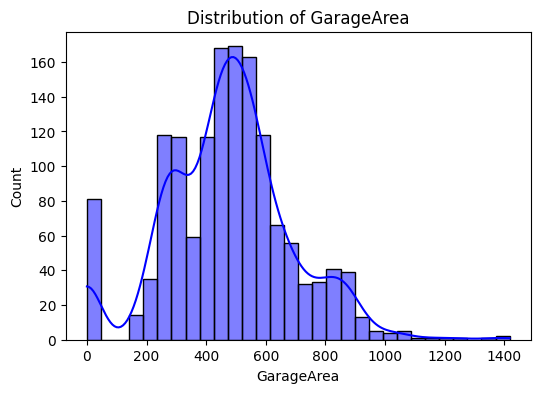

Plotting histogram for: WoodDeckSF


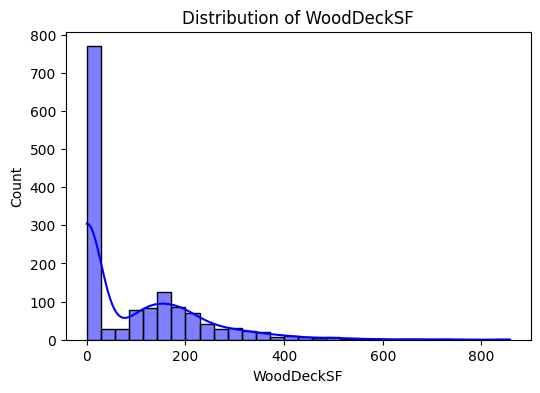

Plotting histogram for: OpenPorchSF


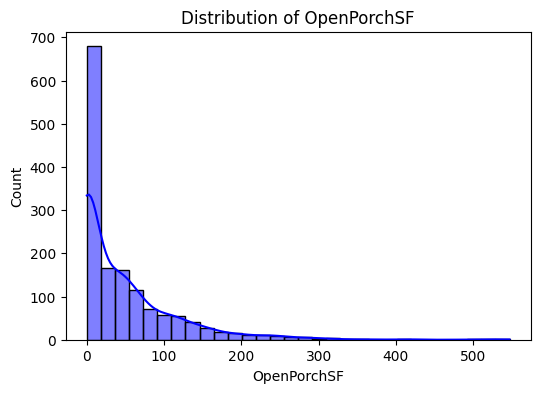

Plotting histogram for: EnclosedPorch


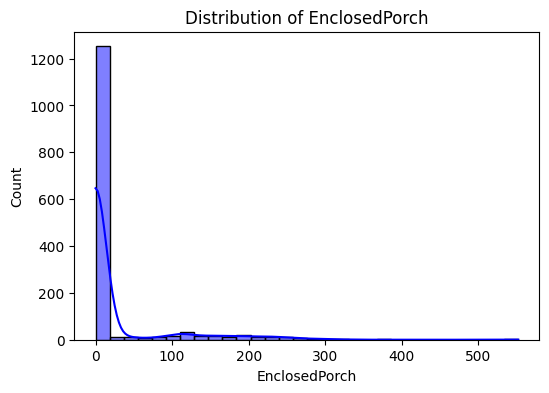

Plotting histogram for: 3SsnPorch


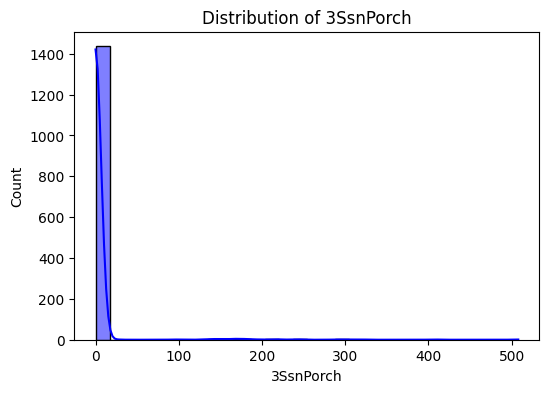

Plotting histogram for: ScreenPorch


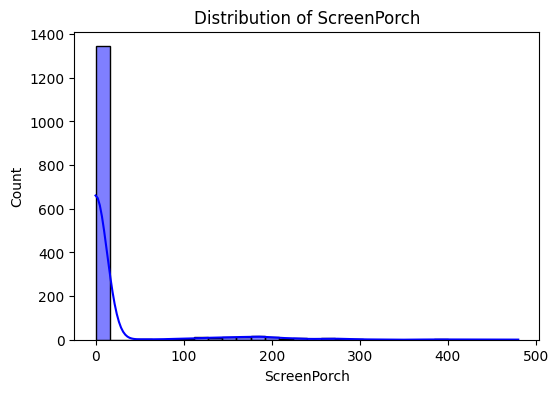

Plotting histogram for: PoolArea


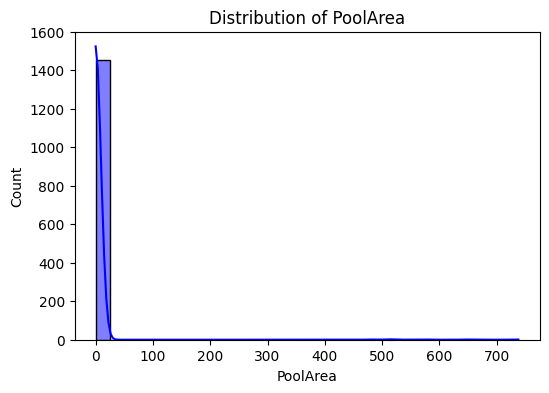

Plotting histogram for: MiscVal


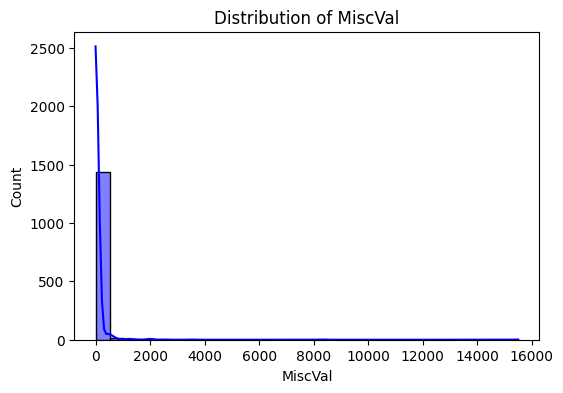

Plotting histogram for: MoSold


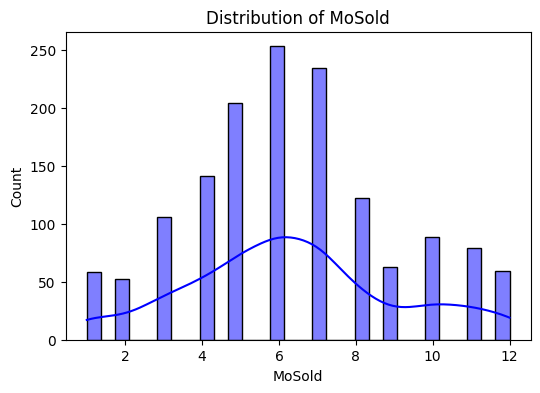

Plotting histogram for: YrSold


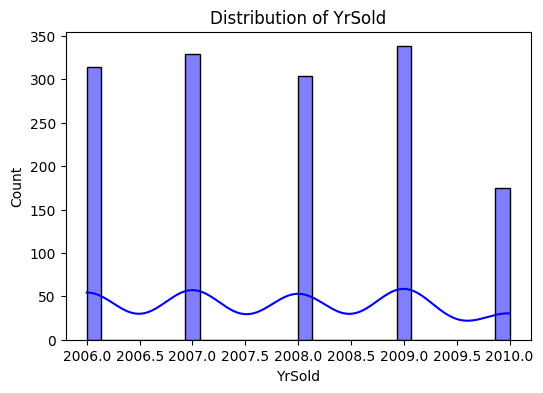

Plotting histogram for: SalePrice


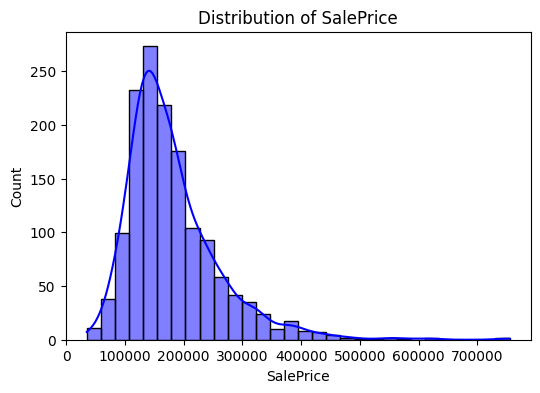

In [16]:
# Histograms for numerical columns
for col in numeric_cols:
    print(f"Plotting histogram for: {col}")
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col].dropna(), bins=30, kde=True, color="blue")
    plt.title(f"Distribution of {col}")
    plt.show()

Plotting count plot for: MSZoning


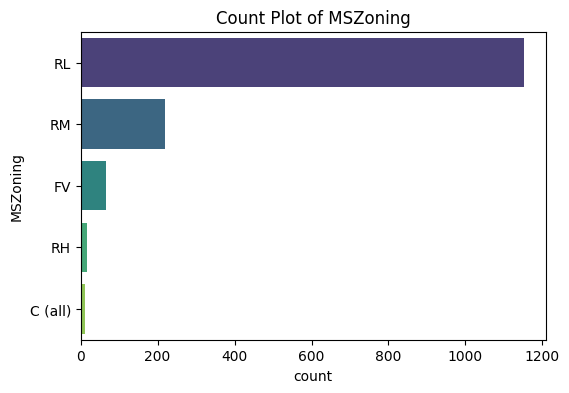

Plotting count plot for: Street


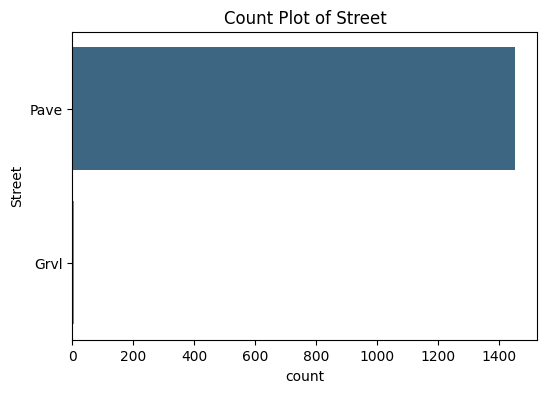

Plotting count plot for: Alley


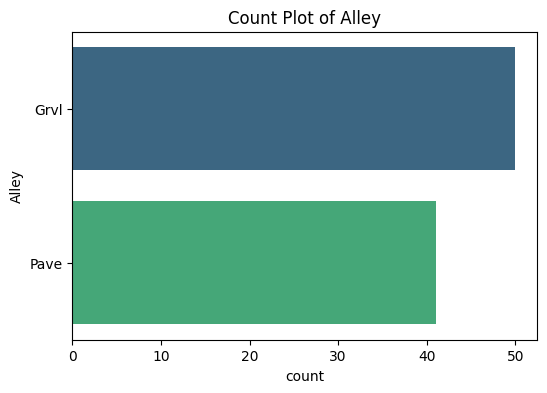

Plotting count plot for: LotShape


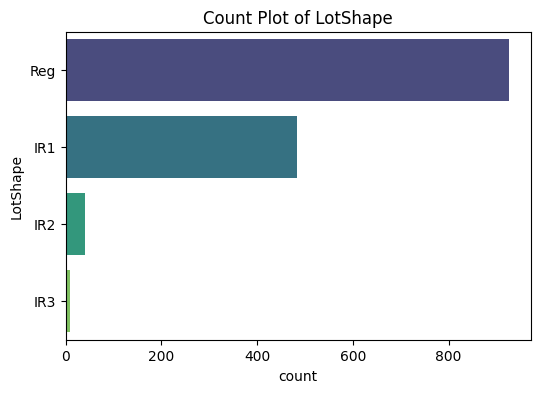

Plotting count plot for: LandContour


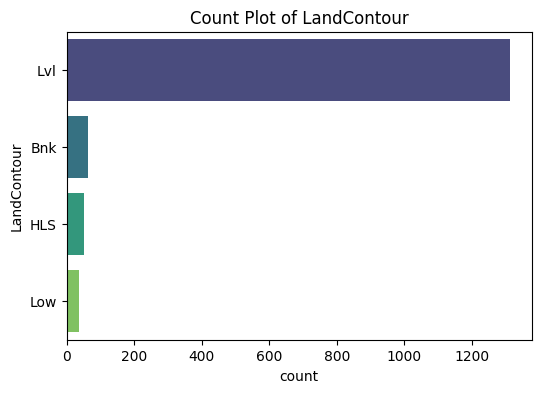

Plotting count plot for: Utilities


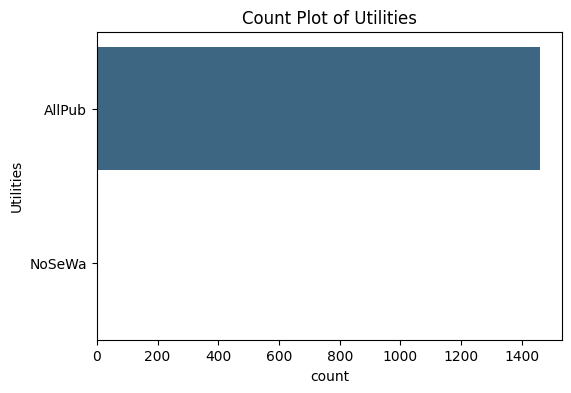

Plotting count plot for: LotConfig


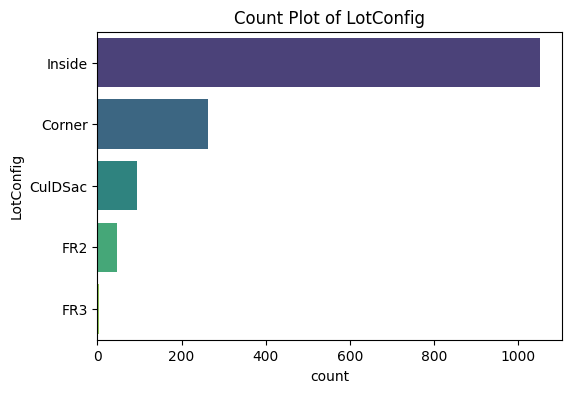

Plotting count plot for: LandSlope


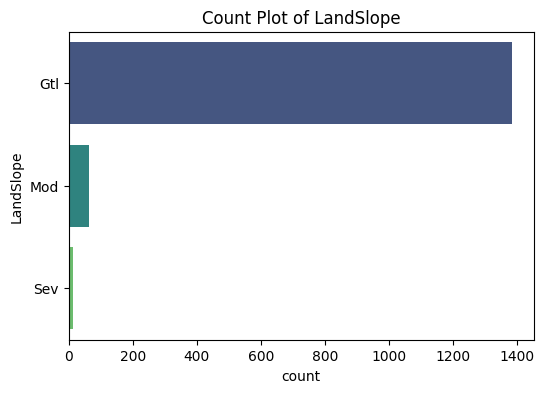

Plotting count plot for: Neighborhood


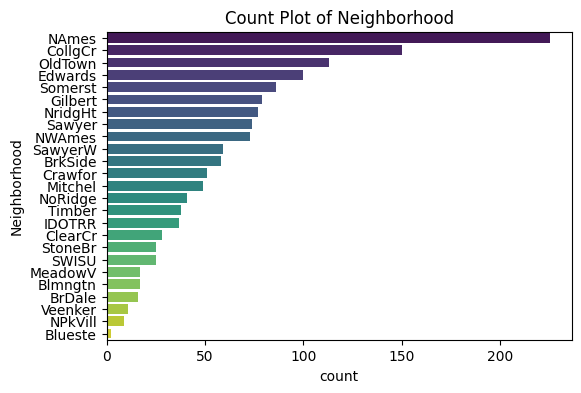

Plotting count plot for: Condition1


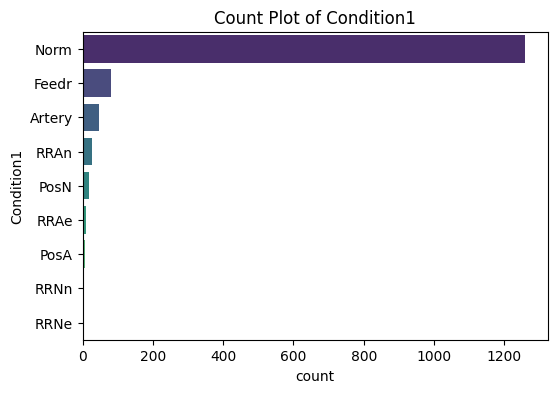

Plotting count plot for: Condition2


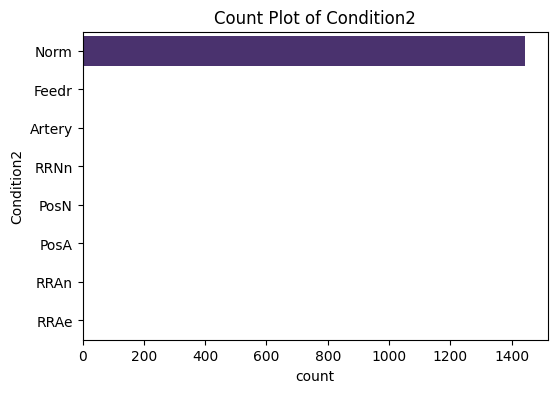

Plotting count plot for: BldgType


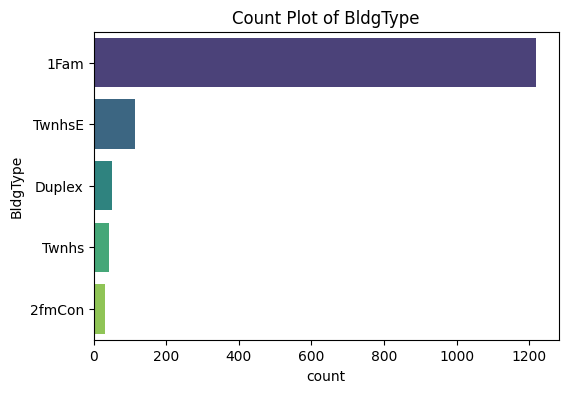

Plotting count plot for: HouseStyle


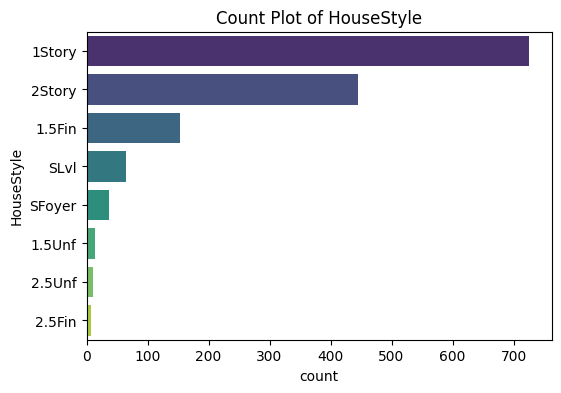

Plotting count plot for: RoofStyle


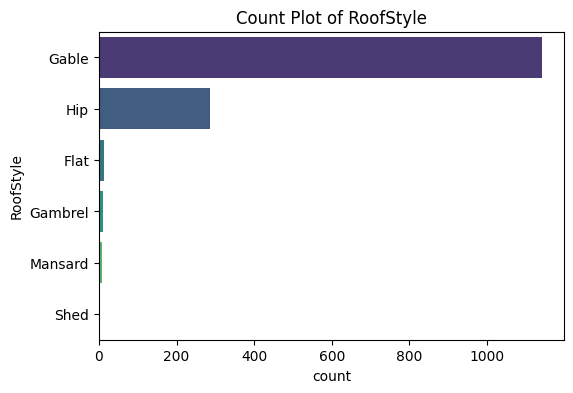

Plotting count plot for: RoofMatl


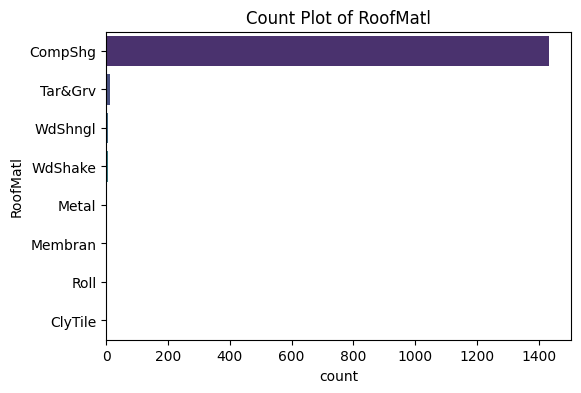

Plotting count plot for: Exterior1st


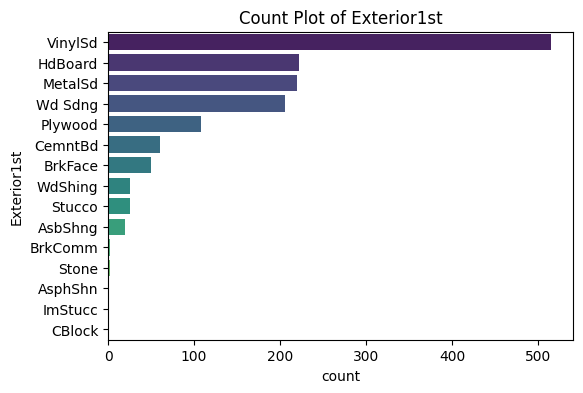

Plotting count plot for: Exterior2nd


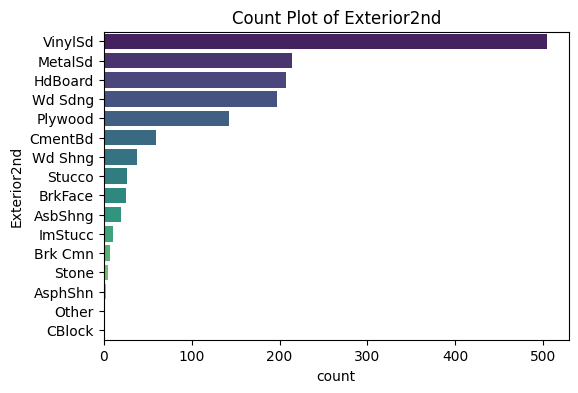

Plotting count plot for: MasVnrType


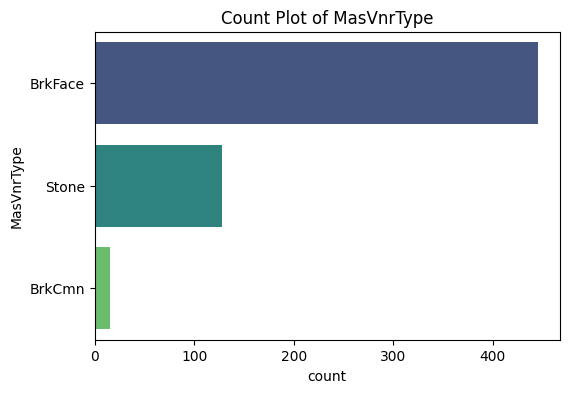

Plotting count plot for: ExterQual


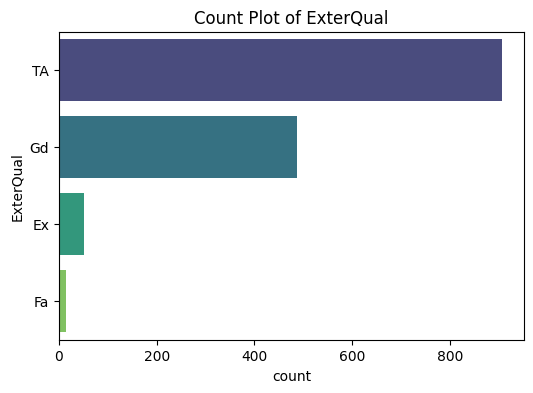

Plotting count plot for: ExterCond


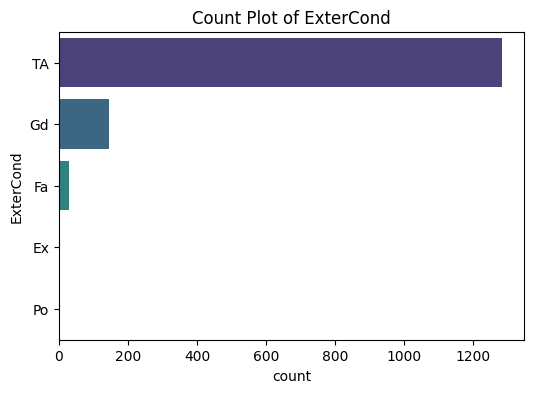

Plotting count plot for: Foundation


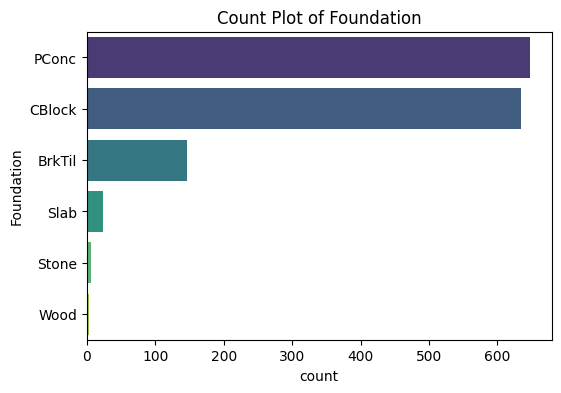

Plotting count plot for: BsmtQual


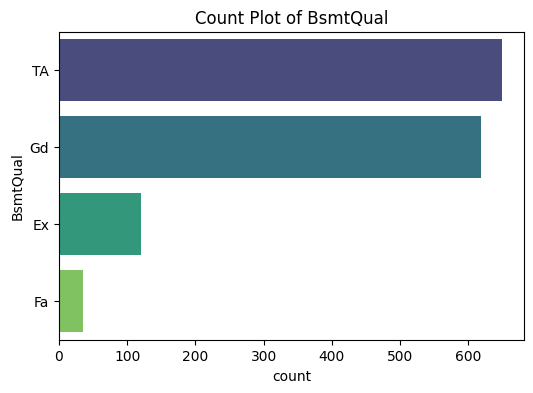

Plotting count plot for: BsmtCond


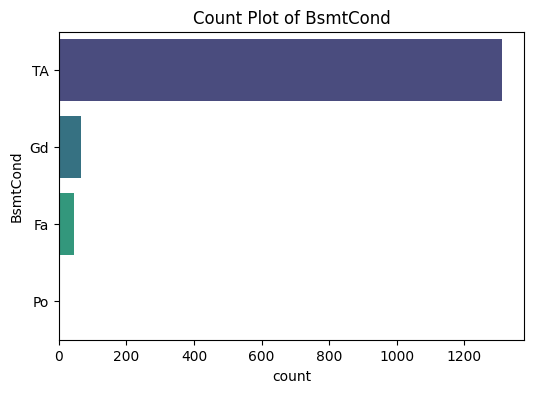

Plotting count plot for: BsmtExposure


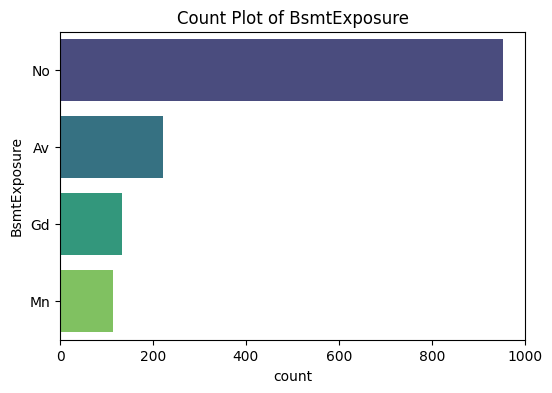

Plotting count plot for: BsmtFinType1


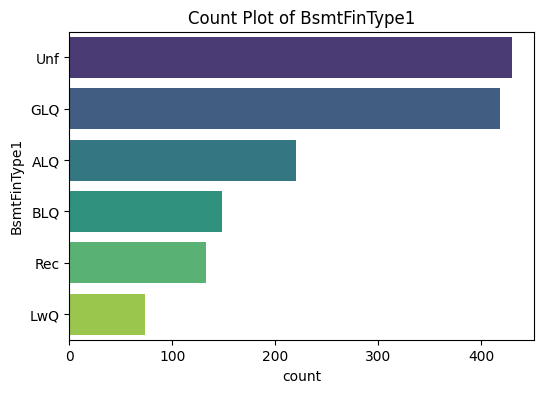

Plotting count plot for: BsmtFinType2


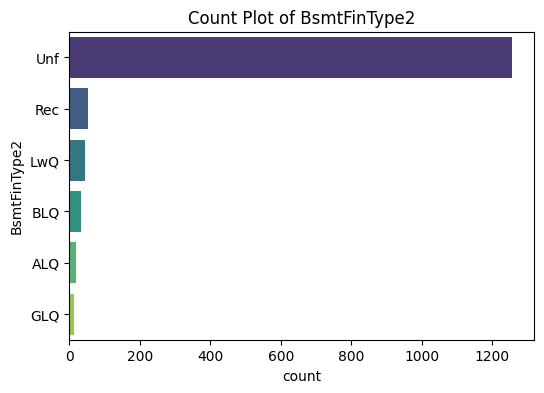

Plotting count plot for: Heating


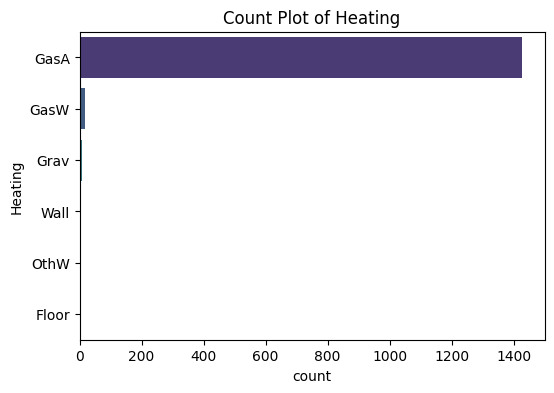

Plotting count plot for: HeatingQC


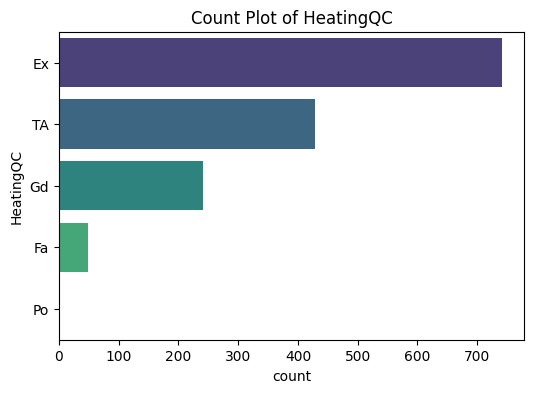

Plotting count plot for: CentralAir


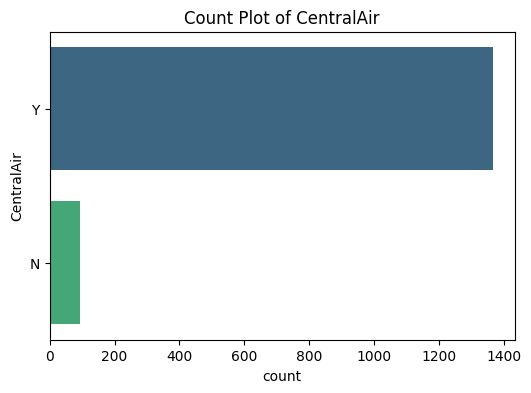

Plotting count plot for: Electrical


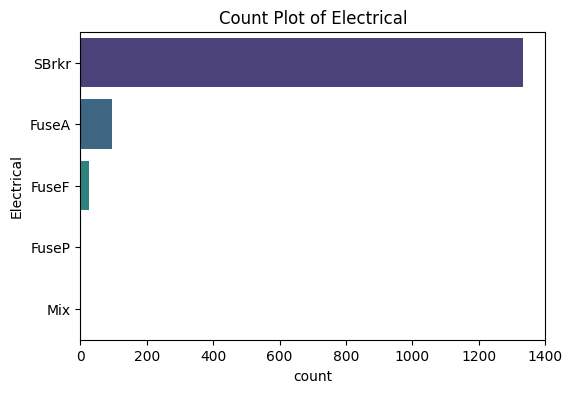

Plotting count plot for: KitchenQual


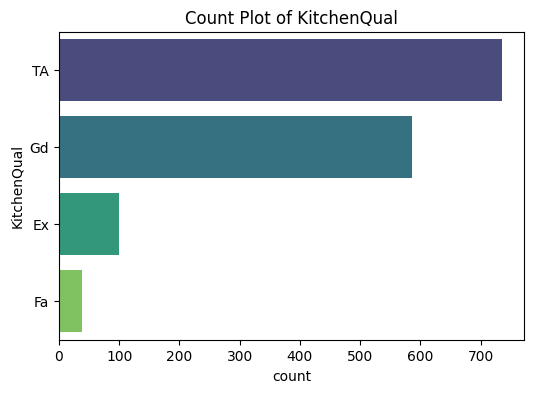

Plotting count plot for: Functional


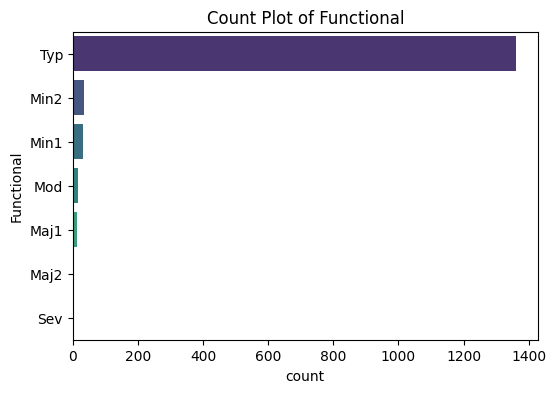

Plotting count plot for: FireplaceQu


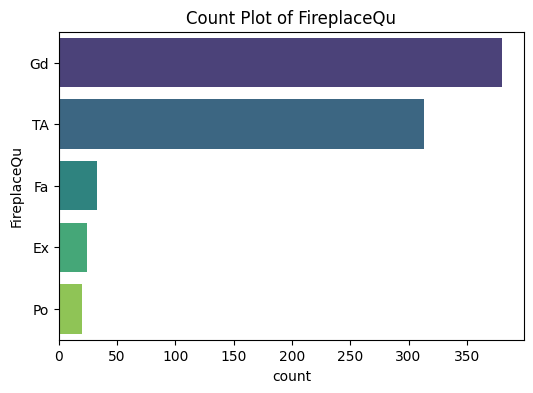

Plotting count plot for: GarageType


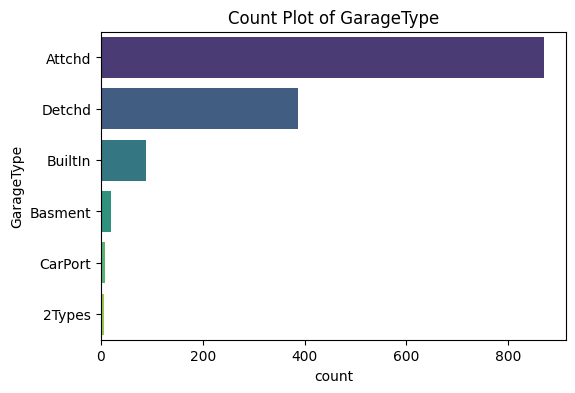

Plotting count plot for: GarageFinish


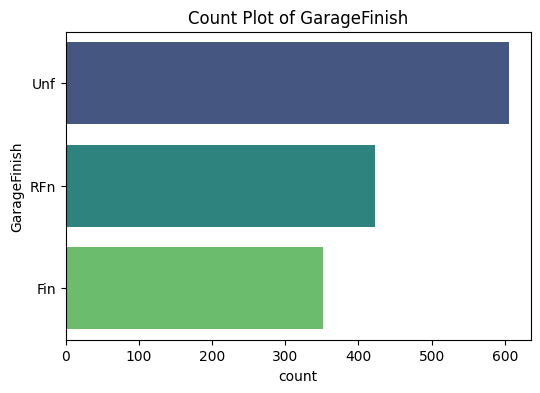

Plotting count plot for: GarageQual


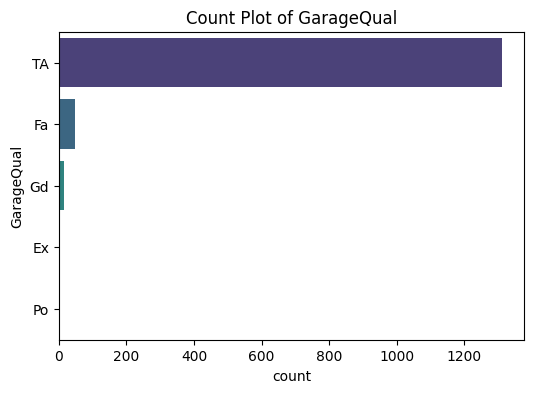

Plotting count plot for: GarageCond


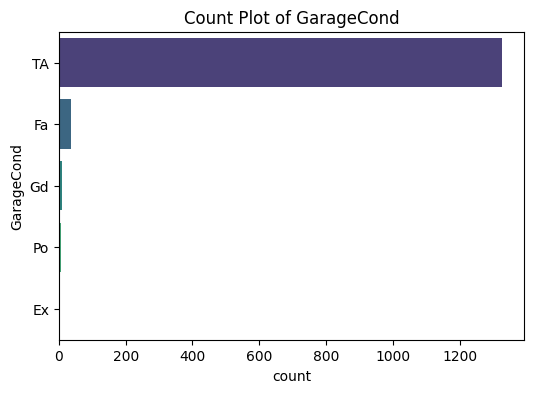

Plotting count plot for: PavedDrive


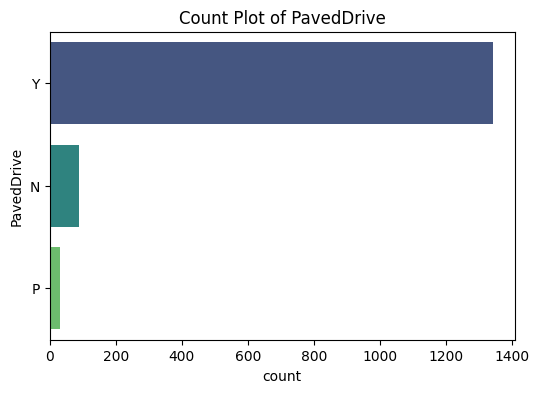

Plotting count plot for: PoolQC


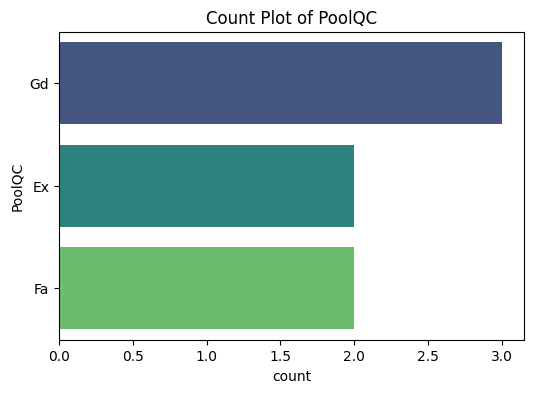

Plotting count plot for: Fence


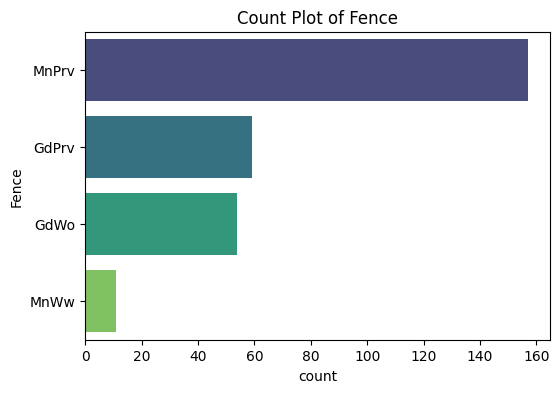

Plotting count plot for: MiscFeature


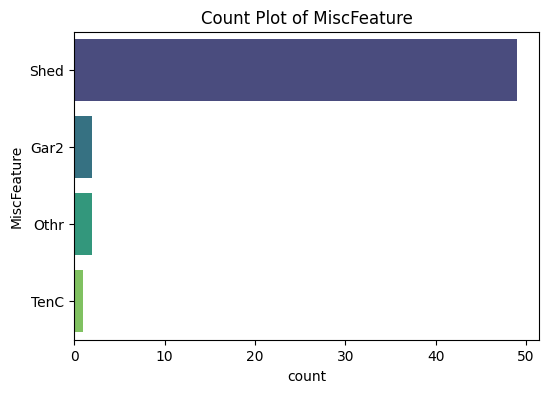

Plotting count plot for: SaleType


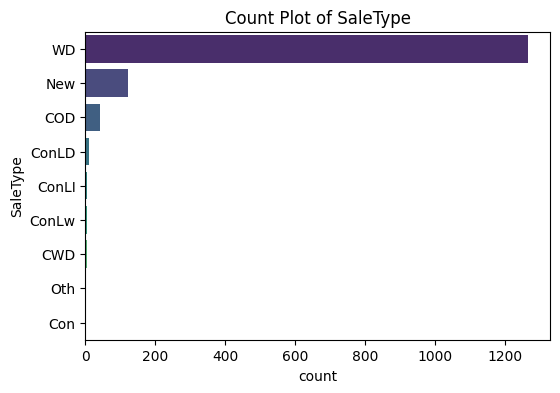

Plotting count plot for: SaleCondition


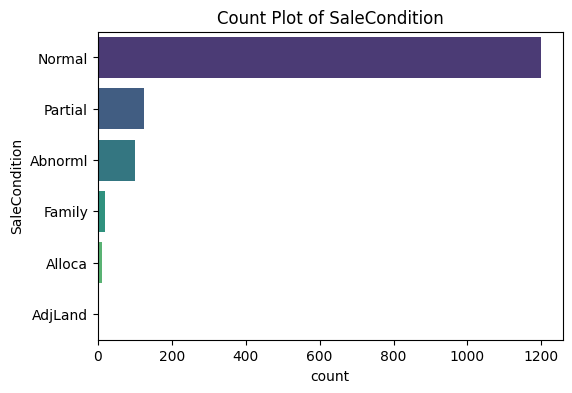

In [17]:
# Count plots for categorical columns
for col in categorical_cols:
    print(f"Plotting count plot for: {col}")
    plt.figure(figsize=(6, 4))
    sns.countplot(y=df[col], order=df[col].value_counts().index, palette="viridis")
    plt.title(f"Count Plot of {col}")
    plt.show()

### Univariate Insights:

1. MSZoning: Most houses fall under RL (Residential Low Density) zoning, indicating a dominance of single-family homes with large lots. Other categories like RM (Residential Medium Density) and FV (Floating Village Residential) have significantly lower representation.

2. HouseStyle: 1Story houses are the most common, followed by 2Story houses. Split-level homes like SLvl and SFoyer have fewer occurrences.

3. Neighborhood: Certain neighborhoods like NAmes and CollgCr have a high frequency of listings, indicating popular housing areas. Expensive neighborhoods like NoRidge and StoneBr have fewer houses listed.

4. SaleCondition: The majority of sales occur under Normal conditions, followed by Partial sales (new constructions before completion). Abnormal sales, foreclosure, and adjacent family sales are relatively rare.

5. BldgType: Single-family detached homes (1Fam) dominate the dataset. Townhouses (Twnhs and TwnhsE) are present but in smaller numbers.

6. GarageType: Attached garages are the most common, indicating that most houses include a garage connected to the main building. Detached garages and built-in garages are less frequent but still common. Carport and missing garages are rare.

Numerical Feature Insights:

1. LotArea: The distribution is right-skewed, with most houses having moderate lot sizes but a few extremely large properties.

2. YearBuilt: Most houses were built in the 1970s–2000s, indicating a predominance of modern homes in the dataset. Few houses date back to the early 1900s.

3. GrLivArea (Above Ground Living Area): The distribution is right-skewed, with a few houses having extremely large living areas.

4. SalePrice: The target variable is right-skewed, indicating that most houses fall within a moderate price range, but a few are very expensive. Suggests potential need for log transformation to normalize the data.

### - Bivariate Analysis

In [20]:
# AutoViz is a Python library that automatically visualizes datasets with minimal code. It generates various plots for univariate, bivariate, and 
# multivariate analysis to help you quickly understand data patterns.

In [21]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

Imported v0.1.905. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


In [22]:
filename = 'data.csv'
sep=','
dft = AV.AutoViz(
    filename,
    sep=",",
    depVar='',
    dfte=None,
    header=0,
    verbose=1,
    lowess=False,
    chart_format='svg',
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
)

Shape of your Data Set loaded: (1460, 81)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  3
    Number of Integer-Categorical Columns =  32
    Number of String-Categorical Columns =  37
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  3
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  2
    Number of ID Columns =  1
    Number of Columns to Delete =  3
    81 Predictors classified...
        4 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Id', 'Alley', 'PoolQC', 'MiscFeature']
3 numeric variables in da

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Id,int64,0.000000,100,1.000000,1460.000000,Possible ID column: drop before modeling step.
MSSubClass,int64,0.000000,1,20.000000,190.000000,Column has 103 outliers greater than upper bound (145.00) or lower than lower bound(-55.00). Cap them or remove them.
MSZoning,object,0.000000,0,,,1 rare categories: ['C (all)']. Group them into a single category or drop the categories.
LotFrontage,float64,17.739726,NA,21.000000,313.000000,"259 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 88 outliers greater than upper bound (111.50) or lower than lower bound(27.50). Cap them or remove them."
LotArea,int64,0.000000,73,1300.000000,215245.000000,Column has 69 outliers greater than upper bound (17673.50) or lower than lower bound(1481.50). Cap them or remove them.
Street,object,0.000000,0,,,No issue
Alley,object,93.767123,0,,,"Possible Zero-variance or low information colum: drop before modeling step., 1369 missing values. Impute them with mean, median, mode, or a constant value such as 123."
LotShape,object,0.000000,0,,,1 rare categories: ['IR3']. Group them into a single category or drop the categories.
LandContour,object,0.000000,0,,,No issue
Utilities,object,0.000000,0,,,No issue


Number of All Scatter Plots = 6
All Plots done
Time to run AutoViz = 45 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [23]:
# Select numerical and categorical columns separately
numeric_cols = df.select_dtypes(include=[np.number]).columns
categorical_cols = df.select_dtypes(include=['object']).columns

In [24]:
# High-correlation numerical features with SalePrice
corr_matrix = df[numeric_cols].corr()
top_corr_features = corr_matrix['SalePrice'].abs().sort_values(ascending=False).index[1:10]  # Exclude SalePrice itself

In [25]:
import matplotlib.pyplot as plt
%matplotlib inline

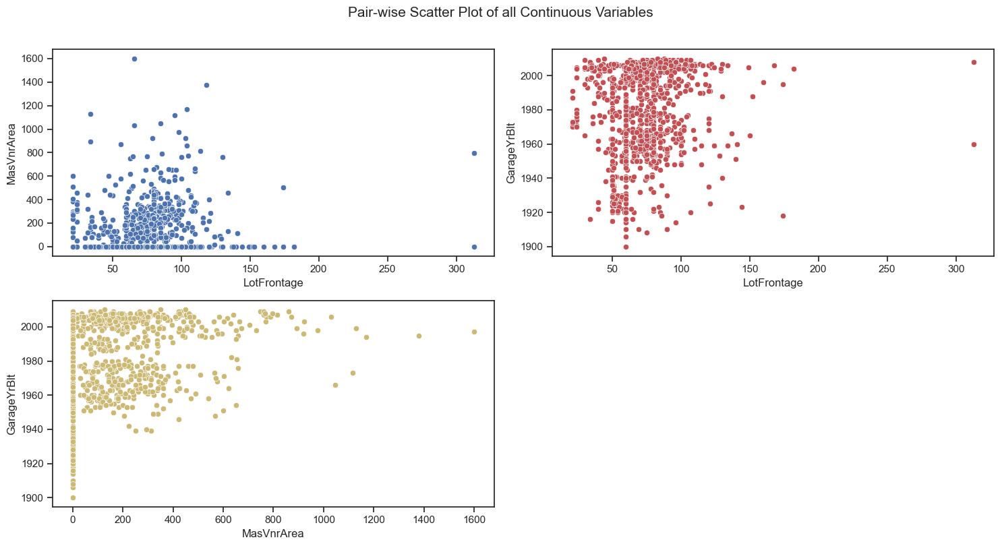

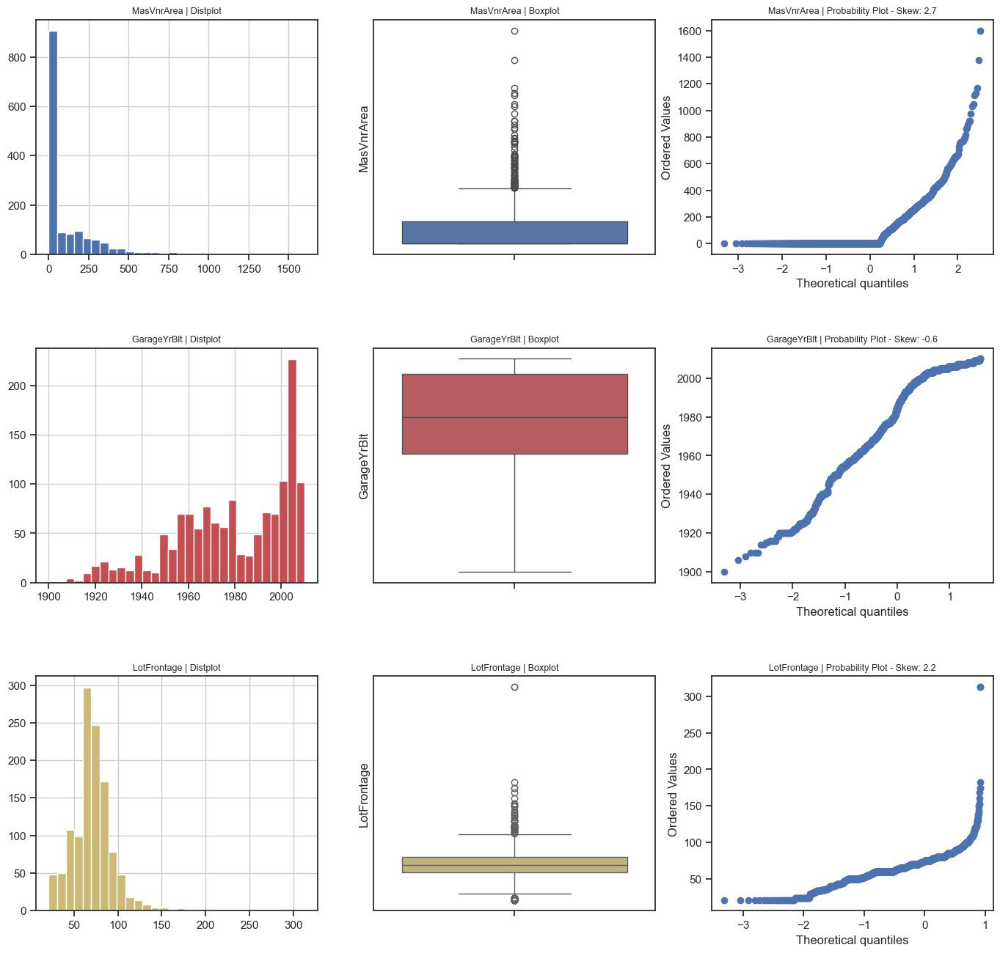

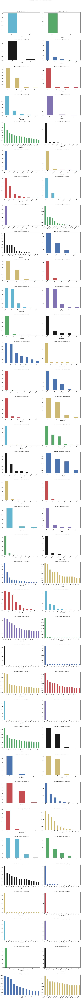

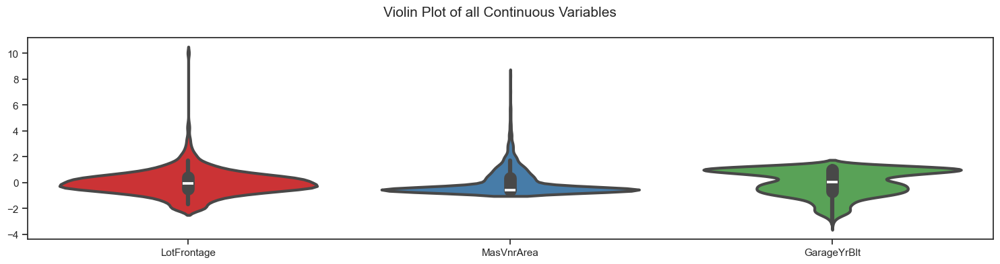

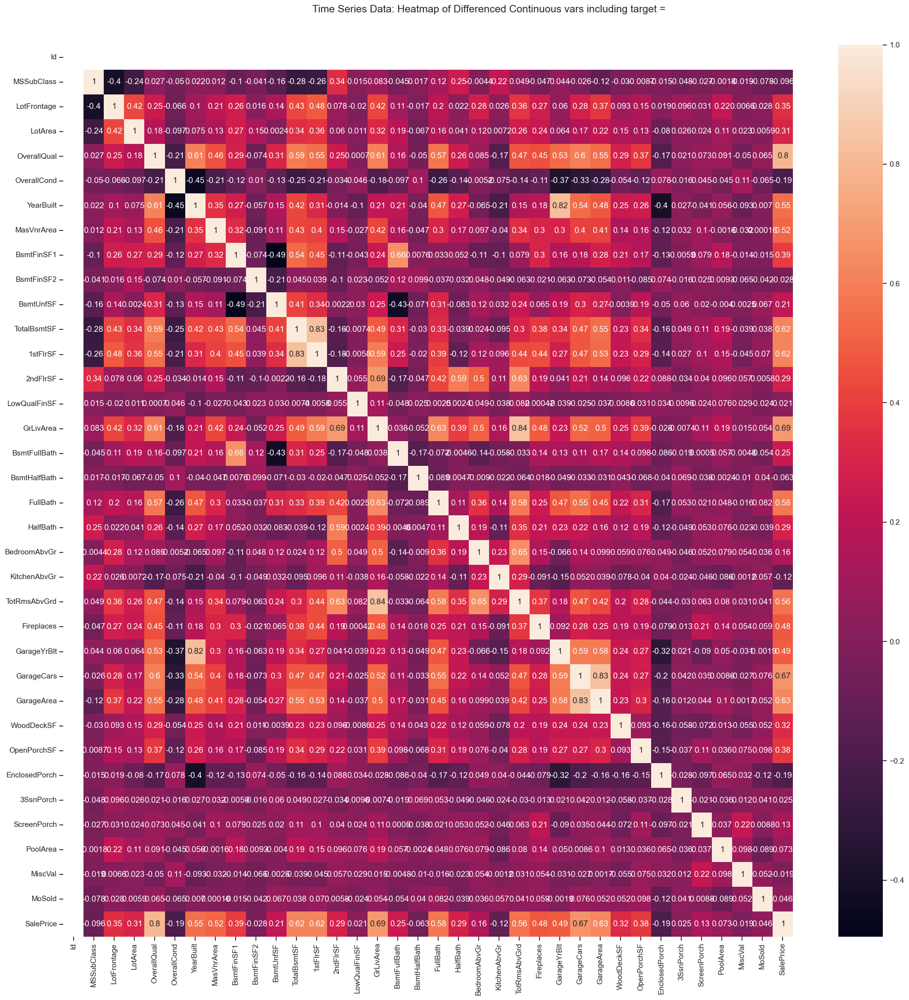

...

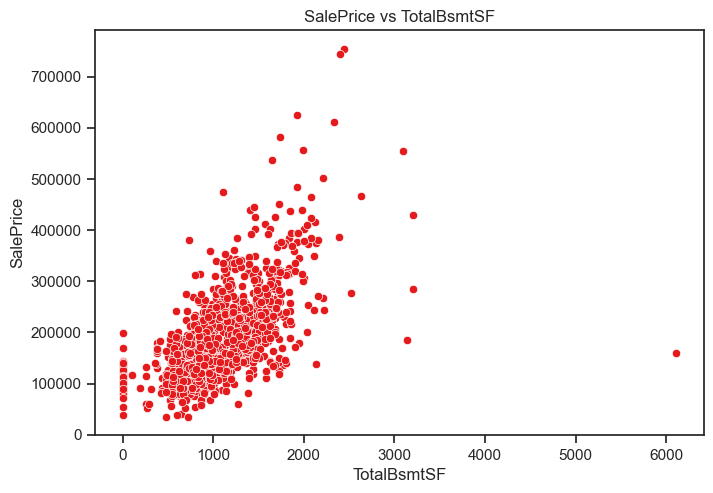

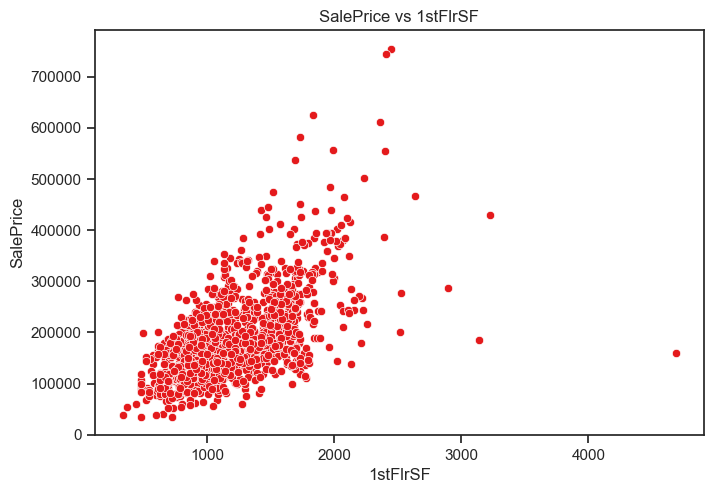

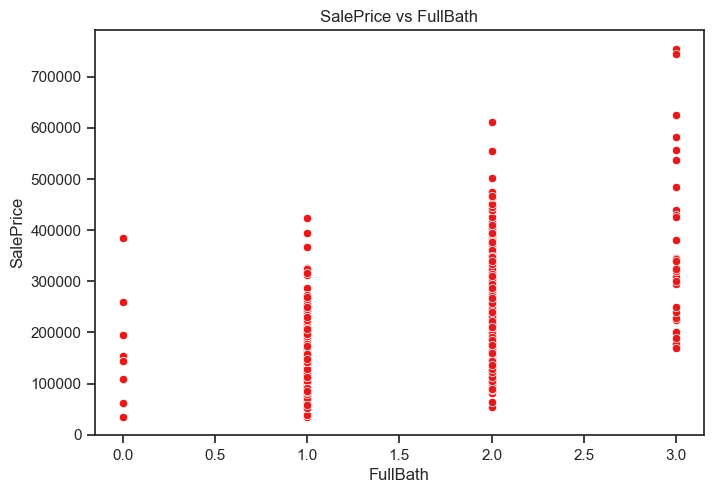

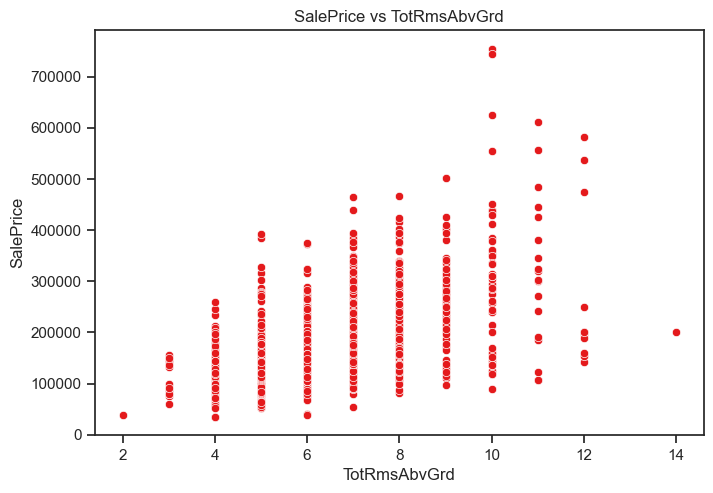

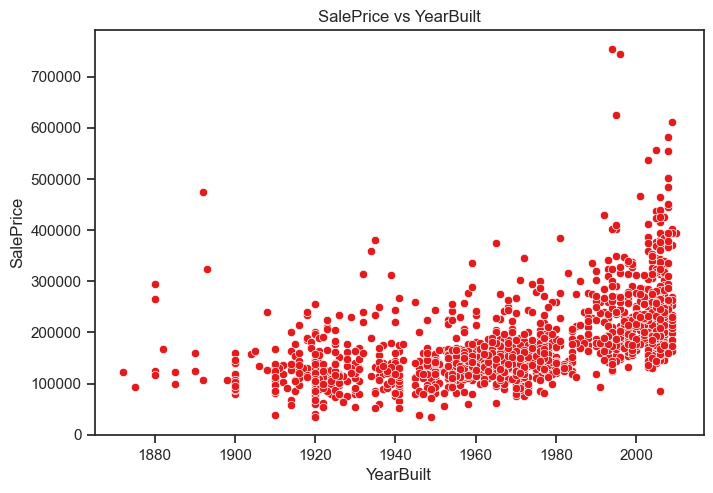

In [26]:
# Scatter plots for highly correlated numerical variables
for col in top_corr_features:
    plt.figure(figsize=(7,5))
    sns.scatterplot(x=df[col], y=df['SalePrice'])
    plt.title(f"SalePrice vs {col}")
    plt.xlabel(col)
    plt.ylabel("SalePrice")
    plt.show()

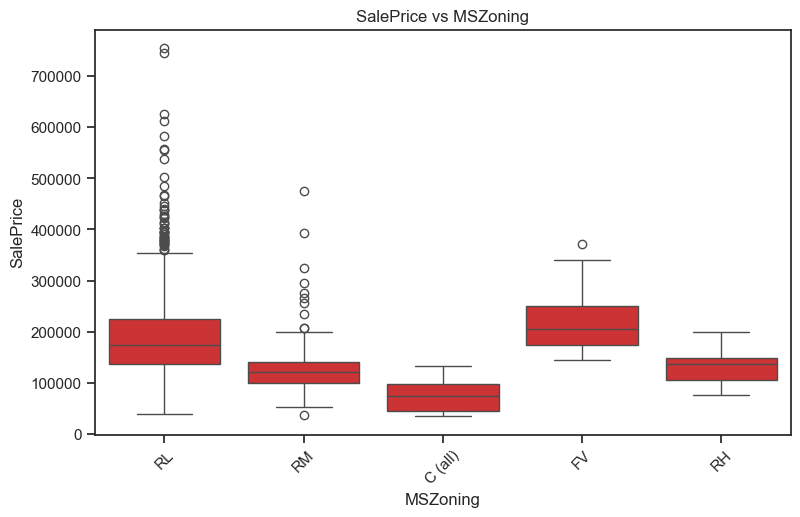

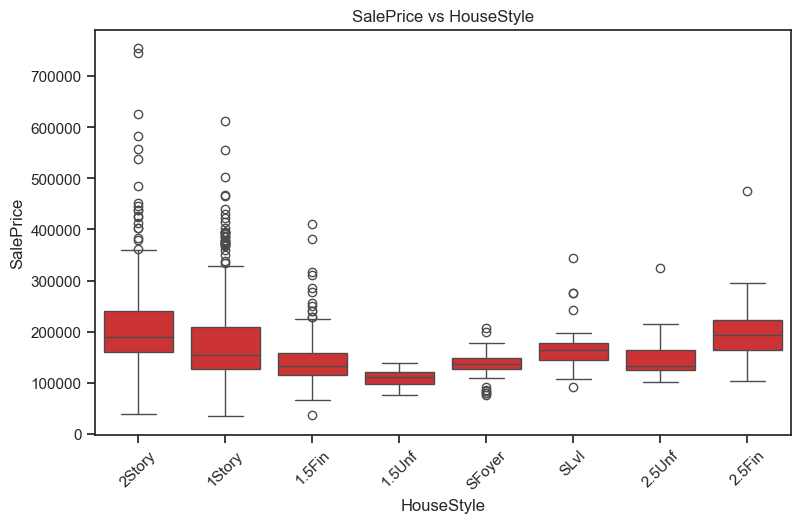

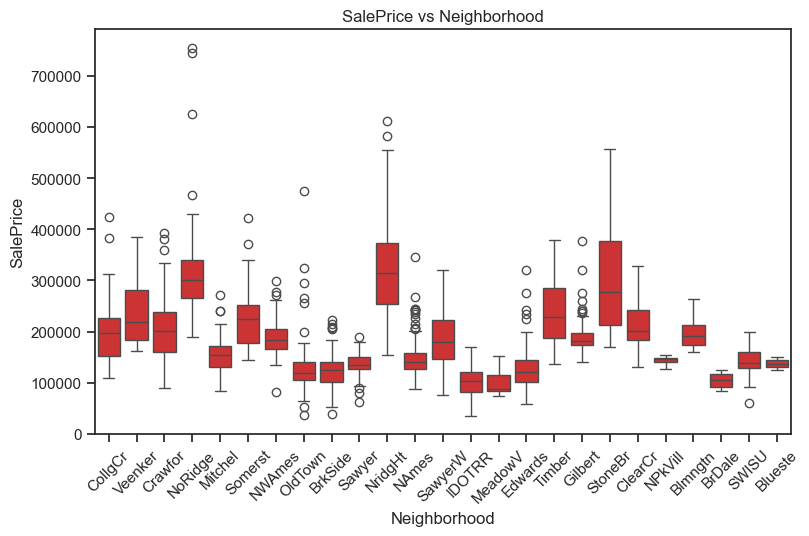

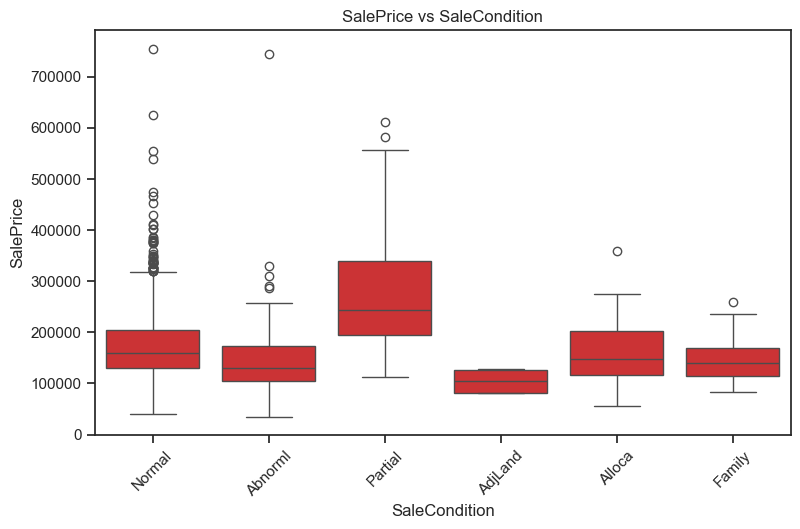

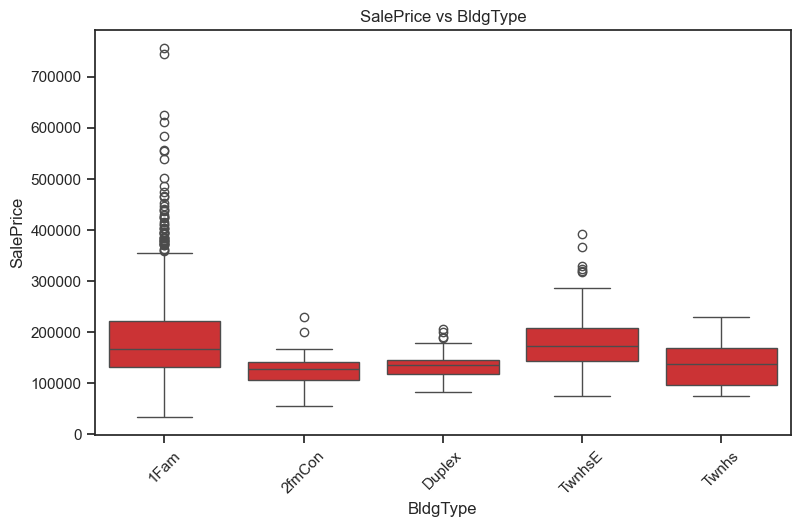

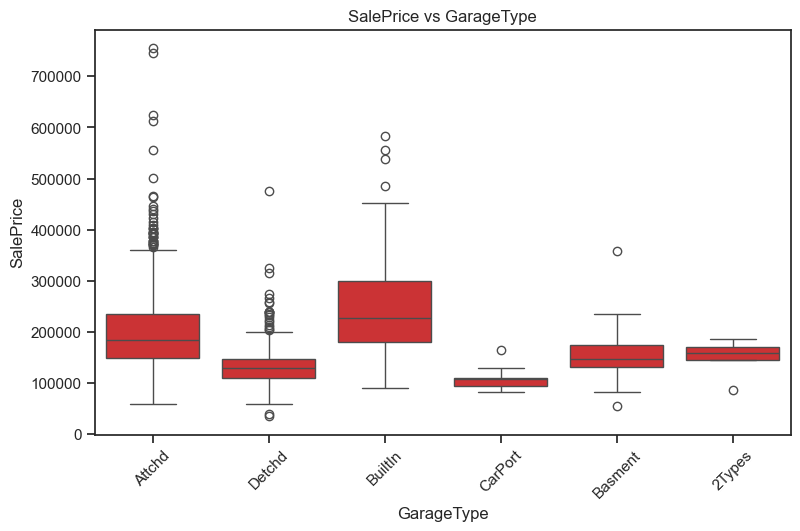

In [27]:
# Box plots for important categorical variables
important_categorical = ['MSZoning', 'HouseStyle', 'Neighborhood', 'SaleCondition', 'BldgType','GarageType']

for col in important_categorical:
    if col in categorical_cols:
        plt.figure(figsize=(8,5))
        sns.boxplot(x=df[col], y=df['SalePrice'])
        plt.title(f"SalePrice vs {col}")
        plt.xticks(rotation=45)
        plt.show()

### Insights for bivariate analysis
OverallQual vs. SalePrice
Insight: Higher OverallQual (quality of construction and materials) strongly correlates with higher house prices.

###2️⃣ GrLivArea vs. SalePrice
✅ Insight: Larger houses (greater GrLivArea) generally have higher prices, but outliers exist.

###3️⃣ TotalBsmtSF vs. SalePrice
✅ Insight: A larger basement (TotalBsmtSF) contributes significantly to house prices.

###4️⃣ GarageCars vs. SalePrice
✅ Insight: The number of garage spaces (GarageCars) directly impacts price.

###5️⃣ LotArea vs. SalePrice
✅ Insight: Lot size has a weaker correlation with price compared to other features.

### Checking Null Values

In [30]:
print(df.isnull().sum().to_string())

MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType        872
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea 

In [31]:
df['LotFrontage'].fillna(df['LotFrontage'].median(),inplace=True)

In [32]:
df['LotFrontage'].isnull().sum()

0

In [33]:
# .mode()[0] --> extracts the first mode value and correctly fills missing values.

In [34]:
df['MasVnrType'].fillna(df['MasVnrType'].mode()[0],inplace=True)

In [35]:
df['MasVnrType'].isnull().sum()

0

In [36]:
df['BsmtQual'].fillna(df['BsmtQual'].mode()[0],inplace=True)

In [37]:
df['BsmtQual'].isnull().sum()

0

In [38]:
df['BsmtCond'].fillna(df['BsmtCond'].mode()[0],inplace=True)

In [39]:
df['BsmtCond'].isnull().sum()

0

In [40]:
df['BsmtExposure'].fillna(df['BsmtExposure'].mode()[0],inplace=True)

In [41]:
df['BsmtExposure'].isnull().sum()

0

In [42]:
df['BsmtFinType1'].fillna(df['BsmtFinType1'].mode()[0],inplace=True)

In [43]:
df['BsmtFinType1'].isnull().sum()

0

In [44]:
df['BsmtFinType2'].fillna(df['BsmtFinType2'].mode()[0],inplace=True)

In [45]:
df['BsmtFinType2'].isnull().sum()

0

In [46]:
df['Electrical'].fillna(df['Electrical'].mode()[0],inplace=True)

In [47]:
df['Electrical'].isnull().sum()

0

In [48]:
df['FireplaceQu'].fillna(df['FireplaceQu'].mode()[0],inplace=True)

In [49]:
df['FireplaceQu'].isnull().sum()

0

In [50]:
df['GarageType'].fillna(df['GarageType'].mode()[0],inplace=True)

In [51]:
df['GarageType'].isnull().sum()

0

In [52]:
df['GarageYrBlt'].fillna(df['GarageYrBlt'].mean(),inplace=True)

In [53]:
df['GarageYrBlt'].isnull().sum()

0

In [54]:
df['GarageFinish'].fillna(df['GarageFinish'].mode()[0],inplace=True)

In [55]:
df['GarageFinish'].isnull().sum()

0

In [56]:
df['GarageQual'].fillna(df['GarageQual'].mode()[0],inplace=True)

In [57]:
df['GarageQual'].isnull().sum()

0

In [58]:
df['GarageCond'].fillna(df['GarageCond'].mode()[0],inplace=True)

In [59]:
df['GarageCond'].isnull().sum()

0

In [60]:
df['Fence'].fillna(df['Fence'].mode()[0],inplace=True)

In [61]:
df['Fence'].isnull().sum()

0

In [62]:
print(df.isnull().sum().to_string())

MSSubClass          0
MSZoning            0
LotFrontage         0
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          0
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual            0
BsmtCond            0
BsmtExposure        0
BsmtFinType1        0
BsmtFinSF1          0
BsmtFinType2        0
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea 

### Removing Outliers

In [64]:
import matplotlib.pyplot as plt
%matplotlib inline

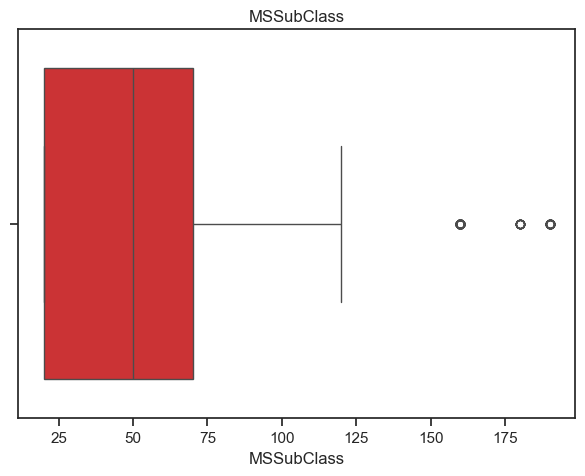

In [65]:
sns.boxplot(x='MSSubClass',data=df)
plt.title("MSSubClass")
plt.show()

In [66]:
Q1 = df['MSSubClass'].quantile(0.25)
Q3 = df['MSSubClass'].quantile(0.75)
IQR = Q3-Q1
print("IQR is =",IQR)

lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
print("Lower_Bound =",lower_bound)
print("Upper_Bound =",upper_bound)

IQR is = 50.0
Lower_Bound = -55.0
Upper_Bound = 145.0


In [67]:
outlier = df[(df['MSSubClass'] < lower_bound) | (df['MSSubClass'] > upper_bound)]
df.drop(outlier.index,inplace=True)

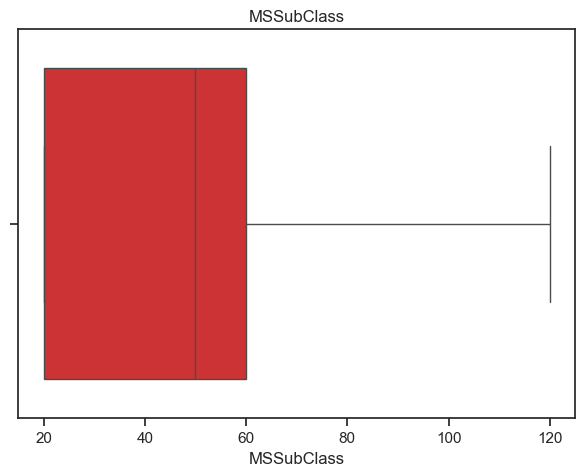

In [68]:
sns.boxplot(x='MSSubClass',data=df)
plt.title("MSSubClass")
plt.show()

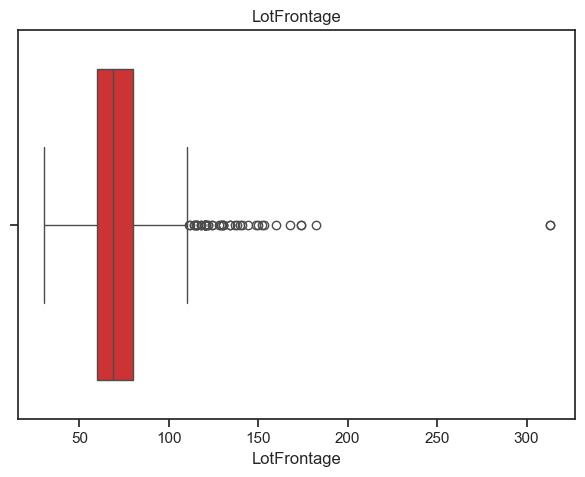

In [69]:
sns.boxplot(x='LotFrontage',data=df)
plt.title("LotFrontage")
plt.show()

In [70]:
Q1 = df['LotFrontage'].quantile(0.25)
Q3 = df['LotFrontage'].quantile(0.75)
IQR = Q3-Q1
print("IQR is =",IQR)

lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
print("Lower_Bound =",lower_bound)
print("Upper_Bound =",upper_bound)

IQR is = 20.0
Lower_Bound = 30.0
Upper_Bound = 110.0


In [71]:
outlier = df[(df['LotFrontage'] < lower_bound) | (df['LotFrontage'] > upper_bound)]
df.drop(outlier.index,inplace=True)

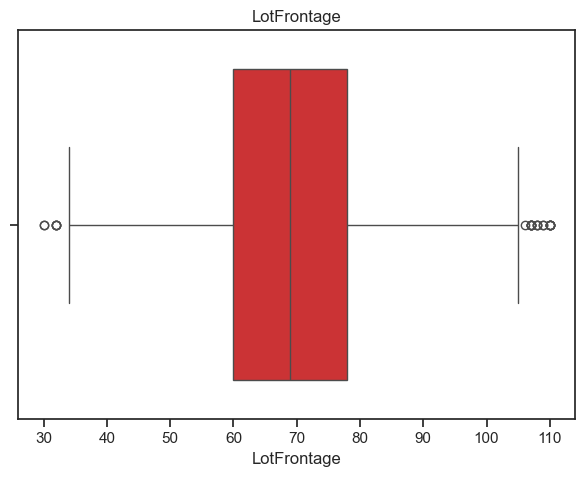

In [72]:
sns.boxplot(x='LotFrontage',data=df)
plt.title("LotFrontage")
plt.show()

In [73]:
print(df['LotFrontage'].skew())  

0.20412041337651693


In [74]:
df.LotFrontage = np.sqrt(df.LotFrontage)

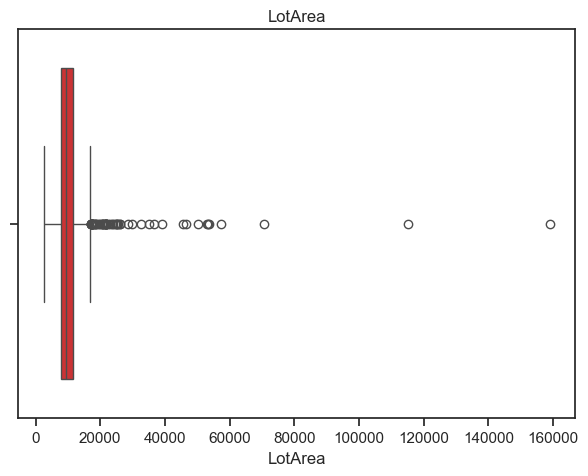

In [75]:
sns.boxplot(x='LotArea',data=df)
plt.title("LotArea")
plt.show()

In [76]:
Q1 = df['LotArea'].quantile(0.25)
Q3 = df['LotArea'].quantile(0.75)
IQR = Q3-Q1
print("IQR is =",IQR)

lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
print("Lower_Bound =",lower_bound)
print("Upper_Bound =",upper_bound)

IQR is = 3624.0
Lower_Bound = 2440.0
Upper_Bound = 16936.0


In [77]:
outlier = df[(df['LotArea'] < lower_bound) | (df['LotArea'] > upper_bound)]
df.drop(outlier.index,inplace=True)

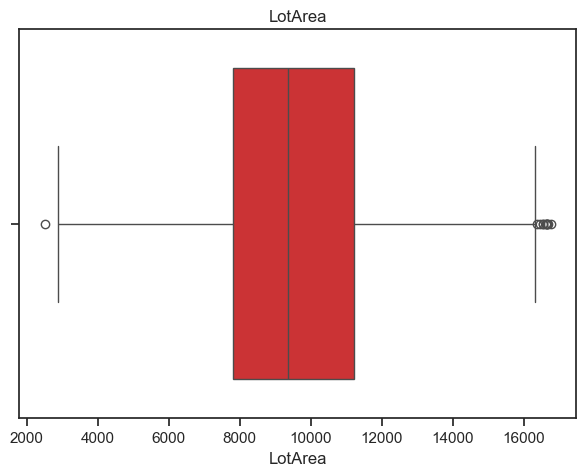

In [78]:
sns.boxplot(x='LotArea',data=df)
plt.title("LotArea")
plt.show()

In [79]:
print(df['LotArea'].skew())  

0.11685232826821446


In [80]:
df.LotArea = np.sqrt(df.LotArea)

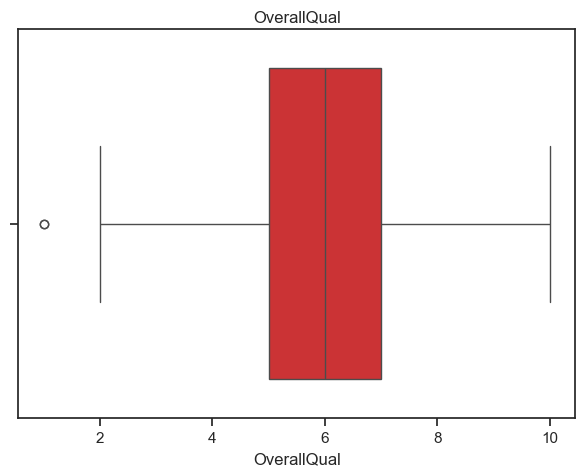

In [81]:
sns.boxplot(x='OverallQual',data=df)
plt.title("OverallQual")
plt.show()

In [82]:
Q1 = df['OverallQual'].quantile(0.25)
Q3 = df['OverallQual'].quantile(0.75)
IQR = Q3-Q1
print("IQR is =",IQR)

lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
print("Lower_Bound =",lower_bound)
print("Upper_Bound =",upper_bound)

IQR is = 2.0
Lower_Bound = 2.0
Upper_Bound = 10.0


In [83]:
outlier = df[(df['OverallQual'] < lower_bound) | (df['OverallQual'] > upper_bound)]
df.drop(outlier.index,inplace=True)

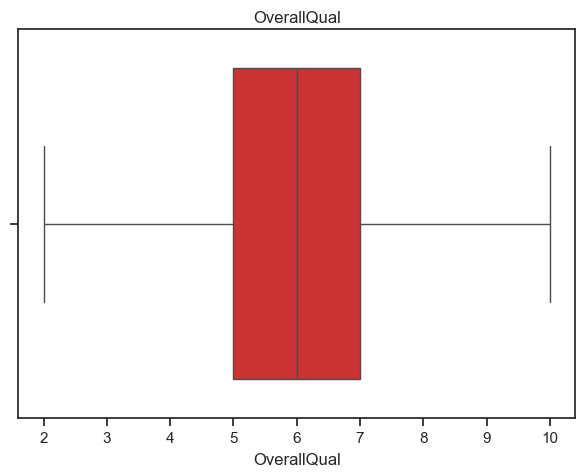

In [84]:
sns.boxplot(x='OverallQual',data=df)
plt.title("OverallQual")
plt.show()

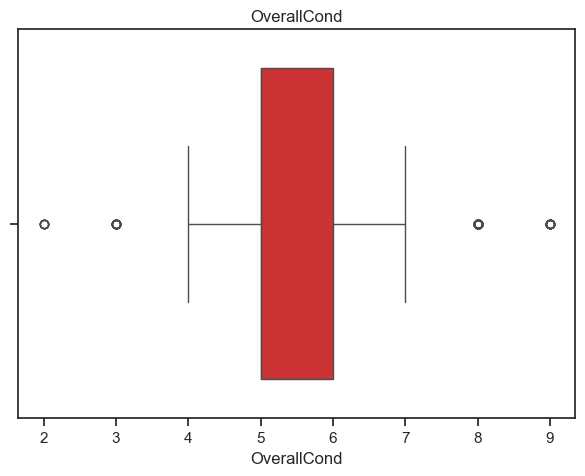

In [85]:
sns.boxplot(x='OverallCond',data=df)
plt.title("OverallCond")
plt.show()

In [86]:
Q1 = df['OverallCond'].quantile(0.25)
Q3 = df['OverallCond'].quantile(0.75)
IQR = Q3-Q1
print("IQR is =",IQR)

lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
print("Lower_Bound =",lower_bound)
print("Upper_Bound =",upper_bound)

IQR is = 1.0
Lower_Bound = 3.5
Upper_Bound = 7.5


In [87]:
outlier = df[(df['OverallCond'] < lower_bound) | (df['OverallCond'] > upper_bound)]
df.drop(outlier.index,inplace=True)

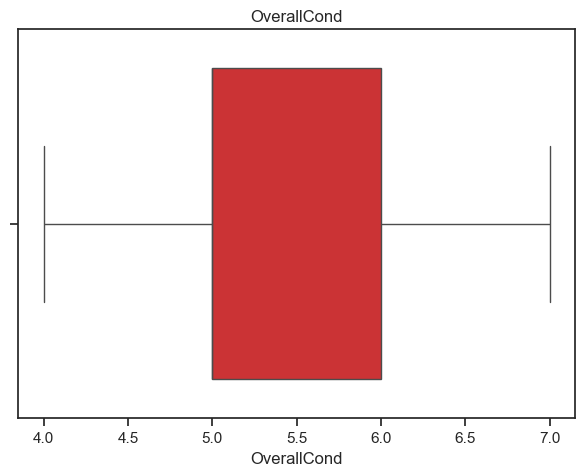

In [88]:
sns.boxplot(x='OverallCond',data=df)
plt.title("OverallCond")
plt.show()

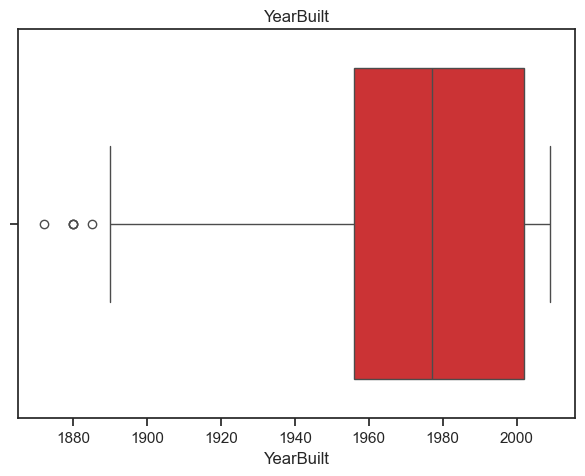

In [89]:
sns.boxplot(x='YearBuilt',data=df)
plt.title("YearBuilt")
plt.show()

In [90]:
Q1 = df['YearBuilt'].quantile(0.25)
Q3 = df['YearBuilt'].quantile(0.75)
IQR = Q3-Q1
print("IQR is =",IQR)

lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
print("Lower_Bound =",lower_bound)
print("Upper_Bound =",upper_bound)

IQR is = 46.0
Lower_Bound = 1887.0
Upper_Bound = 2071.0


In [91]:
outlier = df[(df['YearBuilt'] < lower_bound) | (df['YearBuilt'] > upper_bound)]
df.drop(outlier.index,inplace=True)

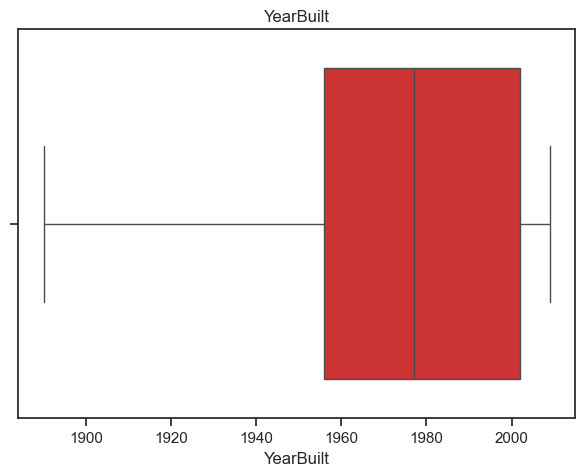

In [92]:
sns.boxplot(x='YearBuilt',data=df)
plt.title("YearBuilt")
plt.show()

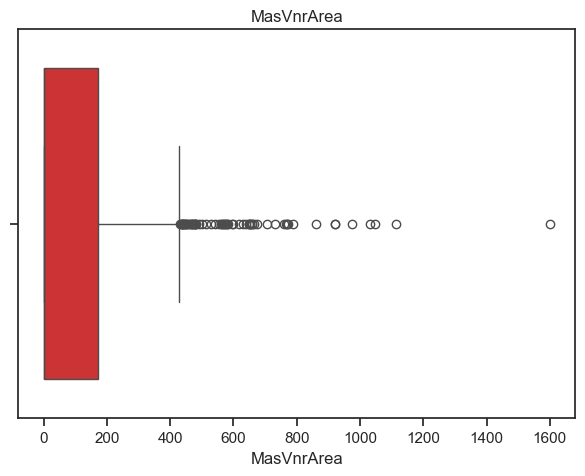

In [93]:
sns.boxplot(x='MasVnrArea',data=df)
plt.title("MasVnrArea")
plt.show()

In [94]:
Q1 = df['MasVnrArea'].quantile(0.25)
Q3 = df['MasVnrArea'].quantile(0.75)
IQR = Q3-Q1
print("IQR is =",IQR)

lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
print("Lower_Bound =",lower_bound)
print("Upper_Bound =",upper_bound)

IQR is = 172.0
Lower_Bound = -258.0
Upper_Bound = 430.0


In [95]:
outlier = df[(df['MasVnrArea'] < lower_bound) | (df['MasVnrArea'] > upper_bound)]
df.drop(outlier.index,inplace=True)

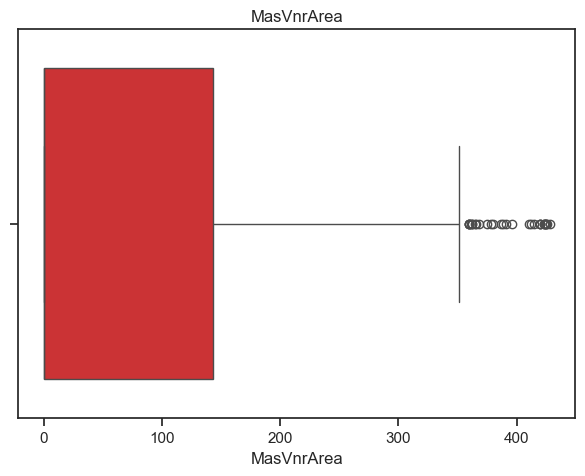

In [96]:
sns.boxplot(x='MasVnrArea',data=df)
plt.title("MasVnrArea")
plt.show()

In [97]:
print(df['MasVnrArea'].skew())  

1.3439348310532853


In [98]:
# Applied log transformation because skewness value is greater than 1 (skew>1)

In [99]:
df['MasVnrArea'] = np.log1p(df['MasVnrArea'])

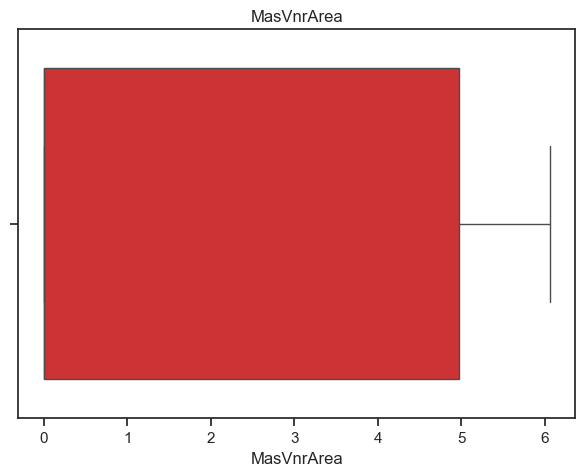

In [100]:
sns.boxplot(x='MasVnrArea',data=df)
plt.title("MasVnrArea")
plt.show()

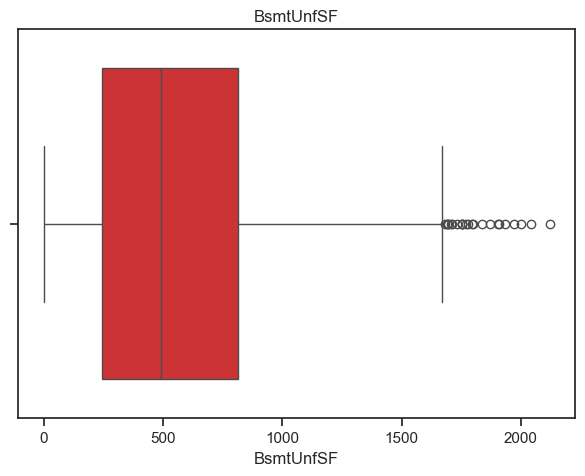

In [101]:
sns.boxplot(x='BsmtUnfSF',data=df)
plt.title("BsmtUnfSF")
plt.show()

In [102]:
Q1 = df['BsmtUnfSF'].quantile(0.25)
Q3 = df['BsmtUnfSF'].quantile(0.75)
IQR = Q3-Q1
print("IQR is =",IQR)

lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
print("Lower_Bound =",lower_bound)
print("Upper_Bound =",upper_bound)

IQR is = 569.5
Lower_Bound = -607.75
Upper_Bound = 1670.25


In [103]:
outlier = df[(df['BsmtUnfSF'] < lower_bound) | (df['BsmtUnfSF'] > upper_bound)]
df.drop(outlier.index,inplace=True)

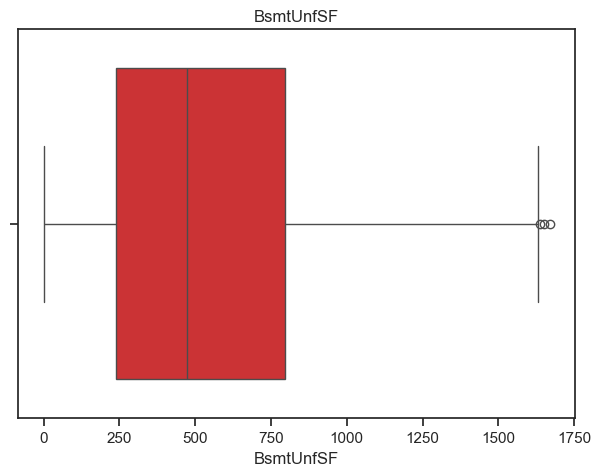

In [104]:
sns.boxplot(x='BsmtUnfSF',data=df)
plt.title("BsmtUnfSF")
plt.show()

In [105]:
print(df['BsmtUnfSF'].skew())  

0.6912149021428367


In [106]:
df.BsmtUnfSF = np.sqrt(df.BsmtUnfSF)

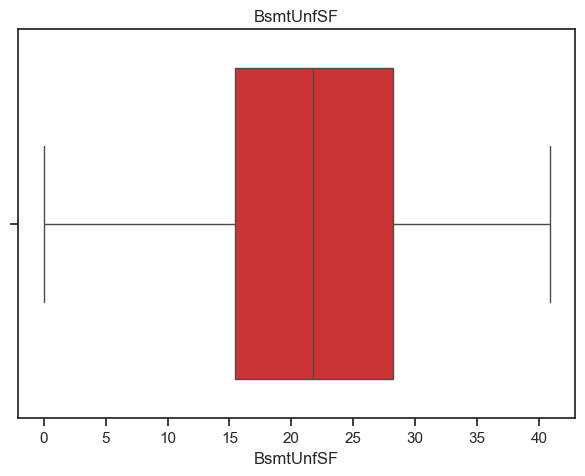

In [107]:
sns.boxplot(x='BsmtUnfSF',data=df)
plt.title("BsmtUnfSF")
plt.show()

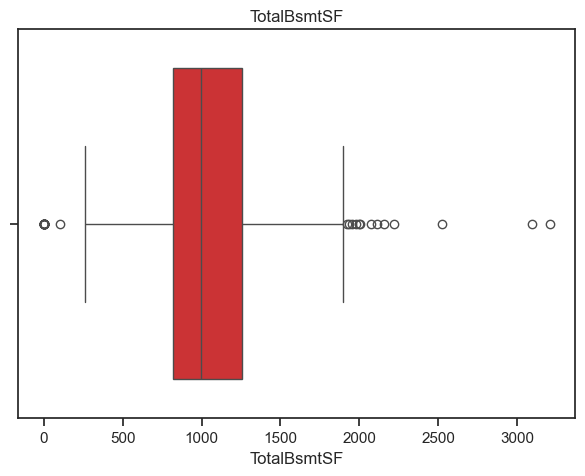

In [108]:
sns.boxplot(x='TotalBsmtSF',data=df)
plt.title("TotalBsmtSF")
plt.show()

In [109]:
Q1 = df['TotalBsmtSF'].quantile(0.25)
Q3 = df['TotalBsmtSF'].quantile(0.75)
IQR = Q3-Q1
print("IQR is =",IQR)

lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
print("Lower_Bound =",lower_bound)
print("Upper_Bound =",upper_bound)

IQR is = 441.25
Lower_Bound = 154.875
Upper_Bound = 1919.875


In [110]:
outlier = df[(df['TotalBsmtSF'] < lower_bound) | (df['TotalBsmtSF'] > upper_bound)]
df.drop(outlier.index,inplace=True)

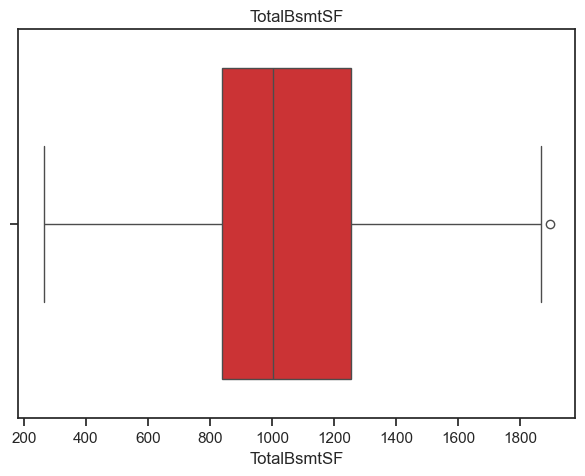

In [111]:
sns.boxplot(x='TotalBsmtSF',data=df)
plt.title("TotalBsmtSF")
plt.show()

In [112]:
df.TotalBsmtSF = np.sqrt(df.TotalBsmtSF)

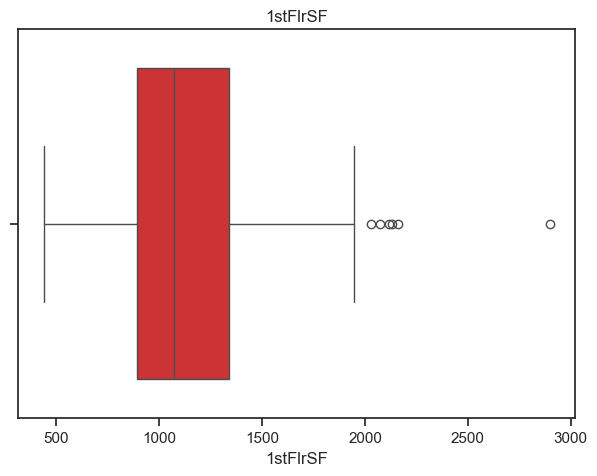

In [113]:
sns.boxplot(x='1stFlrSF',data=df)
plt.title("1stFlrSF")
plt.show()

In [114]:
Q1 = df['1stFlrSF'].quantile(0.25)
Q3 = df['1stFlrSF'].quantile(0.75)
IQR = Q3-Q1
print("IQR is =",IQR)

lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
print("Lower_Bound =",lower_bound)
print("Upper_Bound =",upper_bound)

IQR is = 444.75
Lower_Bound = 225.125
Upper_Bound = 2004.125


In [115]:
outlier = df[(df['1stFlrSF'] < lower_bound) | (df['1stFlrSF'] > upper_bound)]
df.drop(outlier.index,inplace=True)

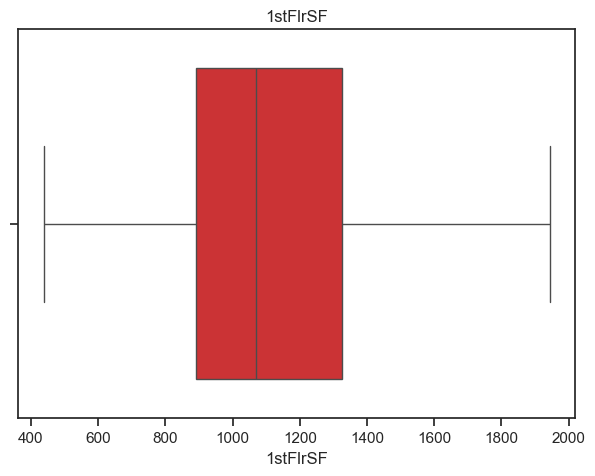

In [116]:
sns.boxplot(x='1stFlrSF',data=df)
plt.title("1stFlrSF")
plt.show()

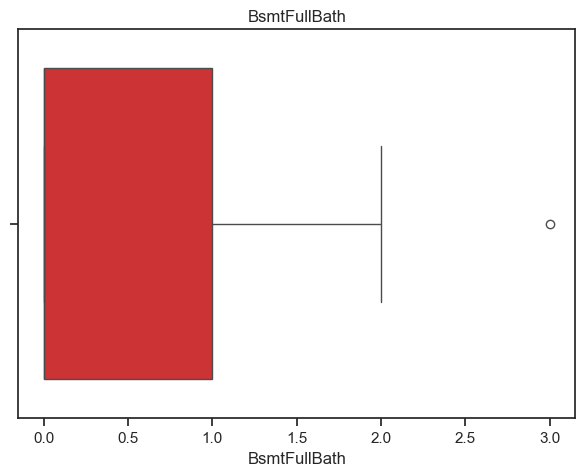

In [117]:
sns.boxplot(x='BsmtFullBath',data=df)
plt.title("BsmtFullBath")
plt.show()

In [118]:
Q1 = df['BsmtFullBath'].quantile(0.25)
Q3 = df['BsmtFullBath'].quantile(0.75)
IQR = Q3-Q1
print("IQR is =",IQR)

lower_bound = Q1-1.5*IQR
upper_bound = Q3+1.5*IQR
print("Lower_Bound =",lower_bound)
print("Upper_Bound =",upper_bound)

IQR is = 1.0
Lower_Bound = -1.5
Upper_Bound = 2.5


In [119]:
outlier = df[(df['BsmtFullBath'] < lower_bound) | (df['BsmtFullBath'] > upper_bound)]
df.drop(outlier.index,inplace=True)

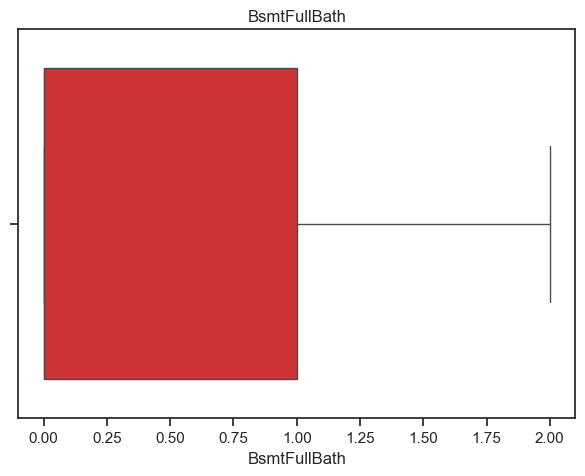

In [120]:
sns.boxplot(x='BsmtFullBath',data=df)
plt.title("BsmtFullBath")
plt.show()

In [121]:
# Drop below columns because they show high correlation 

In [122]:
df.drop('MSZoning',axis=1,inplace=True)
df.drop('RoofStyle',axis=1,inplace=True)
df.drop('MasVnrType',axis=1,inplace=True)
df.drop('ExterQual',axis=1,inplace=True)
df.drop('ExterCond',axis=1,inplace=True)
df.drop('BsmtQual',axis=1,inplace=True)
df.drop('KitchenQual',axis=1,inplace=True)
df.drop('FireplaceQu',axis=1,inplace=True)
df.drop('GarageType',axis=1,inplace=True)
df.drop('GarageQual',axis=1,inplace=True)
df.drop('GarageCond',axis=1,inplace=True)

In [123]:
df.drop('1stFlrSF',axis=1,inplace=True)
df.drop('TotRmsAbvGrd',axis=1,inplace=True)
df.drop('GarageYrBlt',axis=1,inplace=True)
df.drop('GarageArea',axis=1,inplace=True)

## Feature Engineering

### - Encoding

In [126]:
print(df['Street'].value_counts())

Street
Pave    1000
Grvl       3
Name: count, dtype: int64


In [127]:
df1 = pd.get_dummies(df['Street'],prefix='Street',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['Street'],axis=1)

In [128]:
df.head()

,MSSubClass,LotFrontage,LotArea,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,Foundation,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Functional,Fireplaces,GarageFinish,GarageCars,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Street_Pave
0,60,8.062258,91.923882,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,CompShg,VinylSd,VinylSd,5.283204,PConc,TA,No,GLQ,706,Unf,0,12.247449,29.257478,GasA,Ex,Y,SBrkr,854,0,1710,1,0,2,1,3,1,Typ,0,RFn,2,Y,0,61,0,0,0,0,NaN,MnPrv,NaN,0,2,2008,WD,Normal,208500,1
2,60,8.246211,106.066017,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,CompShg,VinylSd,VinylSd,5.093750,PConc,TA,Mn,GLQ,486,Unf,0,20.832667,30.331502,GasA,Ex,Y,SBrkr,866,0,1786,1,0,2,1,3,1,Typ,1,RFn,2,Y,0,42,0,0,0,0,NaN,MnPrv,NaN,0,9,2008,WD,Normal,223500,1
3,70,7.745967,97.724101,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,CompShg,Wd Sdng,Wd Shng,0.000000,BrkTil,Gd,No,ALQ,216,Unf,0,23.237900,27.495454,GasA,Gd,Y,SBrkr,756,0,1717,1,0,1,0,3,1,Typ,1,Unf,3,Y,0,35,272,0,0,0,NaN,MnPrv,NaN,0,2,2006,WD,Abnorml,140000,1
4,60,9.165151,119.415242,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,CompShg,VinylSd,VinylSd,5.860786,PConc,TA,Av,GLQ,655,Unf,0,22.135944,33.837849,GasA,Ex,Y,SBrkr,1053,0,2198,1,0,2,1,4,1,Typ,1,RFn,3,Y,192,84,0,0,0,0,NaN,MnPrv,NaN,0,12,2008,WD,Normal,250000,1
5,50,9.219544,118.806565,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,CompShg,VinylSd,VinylSd,0.000000,Wood,TA,No,GLQ,732,Unf,0,8.000000,28.213472,GasA,Ex,Y,SBrkr,566,0,1362,1,0,1,1,1,1,Typ,0,Unf,2,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000,1


In [129]:
print(df['LotShape'].value_counts())

LotShape
Reg    630
IR1    352
IR2     18
IR3      3
Name: count, dtype: int64


In [130]:
df = df[df['LotShape'] != 'IR3']

In [131]:
df1 = pd.get_dummies(df['LotShape'],prefix='LotShape',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['LotShape'],axis=1)

In [132]:
print(df['LandContour'].value_counts())

LandContour
Lvl    914
Bnk     40
HLS     34
Low     12
Name: count, dtype: int64


In [133]:
df1 = pd.get_dummies(df['LandContour'],prefix='LandContour',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['LandContour'],axis=1)

In [134]:
print(df['Utilities'].value_counts())

Utilities
AllPub    1000
Name: count, dtype: int64


In [135]:
df1 = pd.get_dummies(df['Utilities'],prefix='Utilities',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['Utilities'],axis=1)

In [136]:
print(df['LotConfig'].value_counts())

LotConfig
Inside     736
Corner     171
CulDSac     58
FR2         34
FR3          1
Name: count, dtype: int64


In [137]:
df = df[df['LotConfig'] != 'FR3']

In [138]:
df1 = pd.get_dummies(df['LotConfig'],prefix='LotConfig',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['LotConfig'],axis=1)

In [139]:
print(df['LandSlope'].value_counts())

LandSlope
Gtl    959
Mod     38
Sev      2
Name: count, dtype: int64


In [140]:
df = df[df['LandSlope'] != 'Sev']

In [141]:
df1 = pd.get_dummies(df['LandSlope'],prefix='LandSlope',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['LandSlope'],axis=1)

In [142]:
print(df['Neighborhood'].value_counts())

Neighborhood
NAmes      172
CollgCr    130
OldTown     67
Gilbert     65
NWAmes      58
Sawyer      56
Edwards     55
Somerst     55
SawyerW     48
BrkSide     43
NridgHt     42
Mitchel     34
Crawfor     31
IDOTRR      28
Timber      23
NoRidge     17
Blmngtn     17
SWISU       17
StoneBr     14
ClearCr     12
Veenker      7
NPkVill      4
MeadowV      2
Name: count, dtype: int64


In [143]:
df = df[~df['Neighborhood'].isin(['Veenker', 'NPkVill', 'Blueste'])]

In [144]:
df1 = pd.get_dummies(df['Neighborhood'],prefix='Neighborhood',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['Neighborhood'],axis=1)

In [145]:
df.head()

,MSSubClass,LotFrontage,LotArea,Alley,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofMatl,Exterior1st,Exterior2nd,MasVnrArea,Foundation,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Functional,Fireplaces,GarageFinish,GarageCars,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Street_Pave,LotShape_IR2,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,LandSlope_Mod,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber
0,60,8.062258,91.923882,NaN,Norm,Norm,1Fam,2Story,7,5,2003,2003,CompShg,VinylSd,VinylSd,5.283204,PConc,TA,No,GLQ,706,Unf,0,12.247449,29.257478,GasA,Ex,Y,SBrkr,854,0,1710,1,0,2,1,3,1,Typ,0,RFn,2,Y,0,61,0,0,0,0,NaN,MnPrv,NaN,0,2,2008,WD,Normal,208500,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,60,8.246211,106.066017,NaN,Norm,Norm,1Fam,2Story,7,5,2001,2002,CompShg,VinylSd,VinylSd,5.093750,PConc,TA,Mn,GLQ,486,Unf,0,20.832667,30.331502,GasA,Ex,Y,SBrkr,866,0,1786,1,0,2,1,3,1,Typ,1,RFn,2,Y,0,42,0,0,0,0,NaN,MnPrv,NaN,0,9,2008,WD,Normal,223500,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,70,7.745967,97.724101,NaN,Norm,Norm,1Fam,2Story,7,5,1915,1970,CompShg,Wd Sdng,Wd Shng,0.000000,BrkTil,Gd,No,ALQ,216,Unf,0,23.237900,27.495454,GasA,Gd,Y,SBrkr,756,0,1717,1,0,1,0,3,1,Typ,1,Unf,3,Y,0,35,272,0,0,0,NaN,MnPrv,NaN,0,2,2006,WD,Abnorml,140000,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,60,9.165151,119.415242,NaN,Norm,Norm,1Fam,2Story,8,5,2000,2000,CompShg,VinylSd,VinylSd,5.860786,PConc,TA,Av,GLQ,655,Unf,0,22.135944,33.837849,GasA,Ex,Y,SBrkr,1053,0,2198,1,0,2,1,4,1,Typ,1,RFn,3,Y,192,84,0,0,0,0,NaN,MnPrv,NaN,0,12,2008,WD,Normal,250000,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
5,50,9.219544,118.806565,NaN,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,CompShg,VinylSd,VinylSd,0.000000,Wood,TA,No,GLQ,732,Unf,0,8.000000,28.213472,GasA,Ex,Y,SBrkr,566,0,1362,1,0,1,1,1,1,Typ,0,Unf,2,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


In [146]:
print(df['Condition1'].value_counts())
df = df[~df['Condition1'].isin(['RRAe', 'PosA', 'RRNn', 'RRNe'])]
df1 = pd.get_dummies(df['Condition1'],prefix='Condition1',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['Condition1'],axis=1)

Condition1
Norm      859
Feedr      48
Artery     29
RRAn       20
PosN       14
RRAe        8
RRNn        3
PosA        3
RRNe        2
Name: count, dtype: int64


In [147]:
print(df['Condition2'].value_counts())
df = df[~df['Condition2'].isin(['Feedr', 'Artery', 'RRNn', 'PosN', 'PosA', 'RRAn', 'RRAe'])]
df1 = pd.get_dummies(df['Condition2'],prefix='Condition2',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['Condition2'],axis=1)

Condition2
Norm     966
RRNn       2
Feedr      2
Name: count, dtype: int64


In [148]:
print(df['BldgType'].value_counts())
df1 = pd.get_dummies(df['BldgType'],prefix='BldgType',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['BldgType'],axis=1)

BldgType
1Fam      869
TwnhsE     65
Duplex     26
Twnhs       5
2fmCon      1
Name: count, dtype: int64


In [149]:
print(df['HouseStyle'].value_counts())
df = df[~df['HouseStyle'].isin(['1.5Unf', '2.5Unf', '2.5Fin'])]
df1 = pd.get_dummies(df['HouseStyle'],prefix='HouseStyle',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['HouseStyle'],axis=1)

HouseStyle
1Story    497
2Story    270
1.5Fin    106
SLvl       46
SFoyer     26
1.5Unf     10
2.5Unf      8
2.5Fin      3
Name: count, dtype: int64


In [150]:
#print(df['RoofStyle'].value_counts())
#df = df[~df['RoofStyle'].isin(['Flat', 'Gambrel', 'Mansard', 'Shed'])]
#df1 = pd.get_dummies(df['RoofStyle'],prefix='RoofStyle',dtype=int,drop_first=True)
#df = pd.concat([df,df1],axis=1).drop(['RoofStyle'],axis=1)

In [151]:
print(df['RoofMatl'].value_counts())
df = df[~df['RoofMatl'].isin(['Tar&Grv', 'WdShngl', 'WdShake', 'Metal', 'Membran', 'Roll', 'ClyTile'])]
df1 = pd.get_dummies(df['RoofMatl'],prefix='RoofStyle',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['RoofMatl'],axis=1)

RoofMatl
CompShg    940
Tar&Grv      3
WdShake      1
WdShngl      1
Name: count, dtype: int64


In [152]:
print(df['Exterior1st'].value_counts())
df = df[~df['Exterior1st'].isin(['BrkComm', 'Stone', 'AsphShn', 'ImStucc', 'CBlock'])]
df1 = pd.get_dummies(df['Exterior1st'],prefix='Exterior1st',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['Exterior1st'],axis=1)

Exterior1st
VinylSd    371
HdBoard    154
MetalSd    140
Wd Sdng    124
Plywood     55
CemntBd     32
BrkFace     27
WdShing     15
Stucco      10
AsbShng      9
Stone        1
ImStucc      1
CBlock       1
Name: count, dtype: int64


In [153]:
print(df['Exterior2nd'].value_counts())
df = df[~df['Exterior2nd'].isin(['ImStucc', 'Brk Cmn', 'Stone', 'AsphShn', 'Other', 'CBlock'])]
df1 = pd.get_dummies(df['Exterior2nd'],prefix='Exterior2nd',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['Exterior2nd'],axis=1)

Exterior2nd
VinylSd    364
HdBoard    139
MetalSd    134
Wd Sdng    123
Plywood     78
CmentBd     31
Wd Shng     26
BrkFace     11
AsbShng     11
Stucco      11
ImStucc      5
AsphShn      2
Other        1
Stone        1
Name: count, dtype: int64


In [154]:
print(df['Foundation'].value_counts())
df = df[~df['Foundation'].isin(['Stone', 'Wood'])]
df1 = pd.get_dummies(df['Foundation'],prefix='Foundation',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['Foundation'],axis=1)

Foundation
PConc     445
CBlock    404
BrkTil     75
Wood        2
Stone       2
Name: count, dtype: int64


In [155]:
print(df['BsmtCond'].value_counts())
df = df[df['BsmtCond'] != 'Po']
df1 = pd.get_dummies(df['BsmtCond'],prefix='BsmtCond',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['BsmtCond'],axis=1)

BsmtCond
TA    868
Gd     37
Fa     19
Name: count, dtype: int64


In [156]:
print(df['BsmtExposure'].value_counts())
df1 = pd.get_dummies(df['BsmtExposure'],prefix='BsmtExposure',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['BsmtExposure'],axis=1)

BsmtExposure
No    648
Av    153
Mn     69
Gd     54
Name: count, dtype: int64


In [157]:
print(df['BsmtFinType1'].value_counts())
df1 = pd.get_dummies(df['BsmtFinType1'],prefix='BsmtFinType1',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['BsmtFinType1'],axis=1)

BsmtFinType1
GLQ    273
Unf    264
ALQ    132
BLQ    105
Rec     98
LwQ     52
Name: count, dtype: int64


In [158]:
print(df['BsmtFinType2'].value_counts())
df = df[df['BsmtFinType2'] != 'GLQ']
df1 = pd.get_dummies(df['BsmtFinType2'],prefix='BsmtFinType2',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['BsmtFinType2'],axis=1)

BsmtFinType2
Unf    818
LwQ     37
Rec     27
BLQ     23
ALQ     12
GLQ      7
Name: count, dtype: int64


In [159]:
print(df['Heating'].value_counts())
df = df[~df['Heating'].isin(['Grav', 'Wall', 'OthW', 'Floor'])]
df1 = pd.get_dummies(df['Heating'],prefix='Heating',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['Heating'],axis=1)

Heating
GasA    907
GasW      8
Grav      2
Name: count, dtype: int64


In [160]:
print(df['HeatingQC'].value_counts())
df = df[df['HeatingQC'] != 'Po']
df1 = pd.get_dummies(df['HeatingQC'],prefix='HeatingQC',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['HeatingQC'],axis=1)

HeatingQC
Ex    478
TA    268
Gd    148
Fa     21
Name: count, dtype: int64


In [161]:
print(df['CentralAir'].value_counts())
df1 = pd.get_dummies(df['CentralAir'],prefix='CentralAir',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['CentralAir'],axis=1)

CentralAir
Y    879
N     36
Name: count, dtype: int64


In [162]:
print(df['Electrical'].value_counts())
df = df[~df['Electrical'].isin(['FuseP', 'Mix'])]
df1 = pd.get_dummies(df['Electrical'],prefix='Electrical',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['Electrical'],axis=1)

Electrical
SBrkr    843
FuseA     60
FuseF     12
Name: count, dtype: int64


In [163]:
print(df['Functional'].value_counts())
df = df[~df['Functional'].isin(['Maj1', 'Maj2', 'Sev'])]
df1 = pd.get_dummies(df['Functional'],prefix='Functional',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['Functional'],axis=1)

Functional
Typ     868
Min2     19
Min1     17
Mod       5
Maj2      3
Maj1      3
Name: count, dtype: int64


In [164]:
print(df['GarageFinish'].value_counts())
df1 = pd.get_dummies(df['GarageFinish'],prefix='GarageFinish',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['GarageFinish'],axis=1)

GarageFinish
Unf    390
RFn    292
Fin    227
Name: count, dtype: int64


In [165]:
print(df['PavedDrive'].value_counts())
df1 = pd.get_dummies(df['PavedDrive'],prefix='PavedDrive',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['PavedDrive'],axis=1)

PavedDrive
Y    865
N     30
P     14
Name: count, dtype: int64


In [166]:
print(df['Fence'].value_counts())
df1 = pd.get_dummies(df['Fence'],prefix='Fence',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['Fence'],axis=1)

Fence
MnPrv    828
GdWo      40
GdPrv     32
MnWw       9
Name: count, dtype: int64


In [167]:
print(df['SaleType'].value_counts())
df = df[~df['SaleType'].isin(['ConLD', 'ConLI', 'ConLw', 'CWD', 'Oth', 'Con'])]
df1 = pd.get_dummies(df['SaleType'],prefix='SaleType',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['SaleType'],axis=1)

SaleType
WD       787
New       77
COD       29
CWD        4
ConLI      3
ConLw      3
ConLD      3
Oth        2
Con        1
Name: count, dtype: int64


In [168]:
print(df['SaleCondition'].value_counts())
df = df[~df['SaleCondition'].isin(['Alloca', 'AdjLand'])]
df1 = pd.get_dummies(df['SaleCondition'],prefix='SaleCondition',dtype=int,drop_first=True)
df = pd.concat([df,df1],axis=1).drop(['SaleCondition'],axis=1)

SaleCondition
Normal     738
Partial     78
Abnorml     58
Family      13
Alloca       5
AdjLand      1
Name: count, dtype: int64


In [169]:
df.head()

,MSSubClass,LotFrontage,LotArea,Alley,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,MiscFeature,MiscVal,MoSold,YrSold,SalePrice,Street_Pave,LotShape_IR2,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,LandSlope_Mod,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,Condition1_PosN,Condition1_RRAn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Foundation_CBlock,Foundation_PConc,BsmtCond_Gd,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasW,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_SBrkr,Functional_Min2,Functional_Mod,Functional_Typ,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,SaleType_New,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,8.062258,91.923882,NaN,7,5,2003,2003,5.283204,706,0,12.247449,29.257478,854,0,1710,1,0,2,1,3,1,0,2,0,61,0,0,0,0,NaN,NaN,0,2,2008,208500,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,0,0,1,0,1,0,0,1,0,1,0
2,60,8.246211,106.066017,NaN,7,5,2001,2002,5.093750,486,0,20.832667,30.331502,866,0,1786,1,0,2,1,3,1,1,2,0,42,0,0,0,0,NaN,NaN,0,9,2008,223500,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,0,0,1,0,1,0,0,1,0,1,0
3,70,7.745967,97.724101,NaN,7,5,1915,1970,0.000000,216,0,23.237900,27.495454,756,0,1717,1,0,1,0,3,1,1,3,0,35,272,0,0,0,NaN,NaN,0,2,2006,140000,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,1,0,1,0,1,0,1,0,0,1,0,0,0
4,60,9.165151,119.415242,NaN,8,5,2000,2000,5.860786,655,0,22.135944,33.837849,1053,0,2198,1,0,2,1,4,1,1,3,192,84,0,0,0,0,NaN,NaN,0,12,2008,250000,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,0,0,1,0,1,0,0,1,0,1,0
6,20,8.660254,100.419122,NaN,8,5,2004,2005,5.231109,1369,0,17.804494,41.060930,0,0,1694,1,0,2,0,3,1,1,2,255,57,0,0,0,0,NaN,NaN,0,8,2007,307000,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,0,0,1,0,1,0,0,1,0,1,0


In [170]:
# Drop these columns - 'PoolQC','Alley','MiscFeature' --> Zero-variance or low information column

In [171]:
df.drop('Alley',axis=1,inplace=True)

In [172]:
df.drop('PoolQC',axis=1,inplace=True)
df.drop('MiscFeature',axis=1,inplace=True)

In [174]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 887 entries, 0 to 1459
Columns: 131 entries, MSSubClass to SaleCondition_Partial
dtypes: float64(5), int32(98), int64(28)
memory usage: 575.2 KB


In [176]:
x = df.drop(columns='SalePrice',axis=1)
x

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,Street_Pave,LotShape_IR2,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,LandSlope_Mod,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,Condition1_PosN,Condition1_RRAn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Foundation_CBlock,Foundation_PConc,BsmtCond_Gd,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasW,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_SBrkr,Functional_Min2,Functional_Mod,Functional_Typ,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,SaleType_New,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,8.062258,91.923882,7,5,2003,2003,5.283204,706,0,12.247449,29.257478,854,0,1710,1,0,2,1,3,1,0,2,0,61,0,0,0,0,0,2,2008,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,0,0,1,0,1,0,0,1,0,1,0
2,60,8.246211,106.066017,7,5,2001,2002,5.093750,486,0,20.832667,30.331502,866,0,1786,1,0,2,1,3,1,1,2,0,42,0,0,0,0,0,9,2008,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,0,0,1,0,1,0,0,1,0,1,0
3,70,7.745967,97.724101,7,5,1915,1970,0.000000,216,0,23.237900,27.495454,756,0,1717,1,0,1,0,3,1,1,3,0,35,272,0,0,0,0,2,2006,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,1,0,1,0,1,0,1,0,0,1,0,0,0
4,60,9.165151,119.415242,8,5,2000,2000,5.860786,655,0,22.135944,33.837849,1053,0,2198,1,0,2,1,4,1,1,3,192,84,0,0,0,0,0,12,2008,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,0,0,1,0,1,0,0,1,0,1,0
6,20,8.660254,100.419122,8,5,2004,2005,5.231109,1369,0,17.804494,41.060930,0,0,1694,1,0,2,0,3,1,1,2,255,57,0,0,0,0,0,8,2007,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,0,0,1,0,1,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [178]:
y = df.SalePrice
y

0       208500
2       223500
3       140000
4       250000
6       307000
         ...  
1451    287090
1454    185000
1455    175000
1458    142125
1459    147500
Name: SalePrice, Length: 887, dtype: int64

### - Scaling

In [180]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_scaled = sc.fit_transform(x)

In [182]:
x_scaled

array([[ 0.39067999, -0.25680259, -0.25594264, ..., -0.12195959,
         0.44932952, -0.31050818],
       [ 0.39067999, -0.03679499,  0.74930626, ..., -0.12195959,
         0.44932952, -0.31050818],
       [ 0.72614286, -0.63508533,  0.15634761, ..., -0.12195959,
        -2.22553817, -0.31050818],
       ...,
       [ 0.39067999, -0.48194863, -0.46537504, ..., -0.12195959,
         0.44932952, -0.31050818],
       [-0.95117151, -0.03679499,  0.21682   , ..., -0.12195959,
         0.44932952, -0.31050818],
       [-0.95117151,  0.45839839,  0.29569649, ..., -0.12195959,
         0.44932952, -0.31050818]])

## Feature Selection

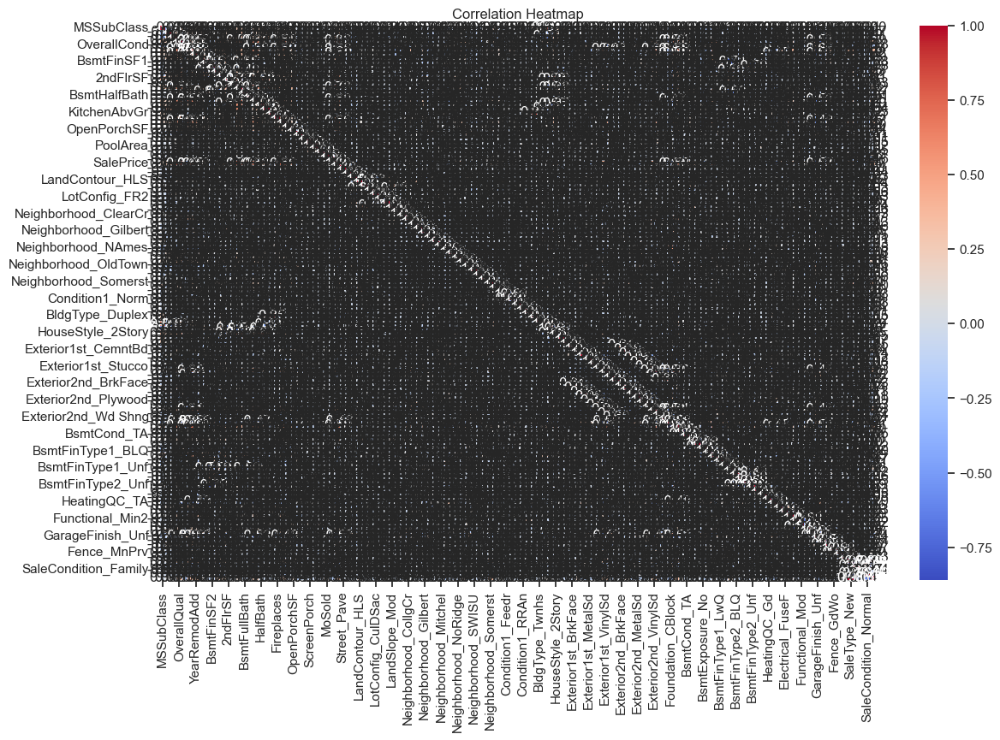

In [184]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Heatmap")
plt.show()

In [186]:
df.corr()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,Street_Pave,LotShape_IR2,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,LandSlope_Mod,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Feedr,Condition1_Norm,Condition1_PosN,Condition1_RRAn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Foundation_CBlock,Foundation_PConc,BsmtCond_Gd,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasW,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_SBrkr,Functional_Min2,Functional_Mod,Functional_Typ,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,SaleType_New,SaleType_WD,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
MSSubClass,1.000000,-0.281144,-0.349668,0.258746,-0.151726,0.185607,0.175085,0.063658,-0.039033,-0.094239,-0.025576,-0.122602,0.310512,-0.005714,0.244220,0.046780,0.012014,0.213655,0.213062,-0.087691,0.185800,0.141524,0.168674,0.083536,0.083479,-0.009405,-0.025227,0.006568,0.006587,-0.032693,0.023244,-0.001603,0.154837,-0.046935,-0.016450,-0.007701,0.039925,0.052299,-0.030157,0.004620,0.007582,0.035128,0.035220,-0.027113,0.057449,-0.057332,0.067482,-0.070955,0.081524,-0.010648,0.114256,0.075942,-0.205073,-0.042724,0.041584,0.139576,-0.012356,0.013108,-0.122831,0.049353,-0.013981,0.242770,-0.047125,-0.081313,0.049261,-0.010899,0.002202,-0.031955,0.217555,0.161766,0.653148,-0.433672,0.290821,0.205117,0.225821,-0.084030,0.082585,-0.051366,-0.016684,0.020802,0.013269,0.098450,-0.094153,-0.013290,-0.075830,0.089833,-0.006805,-0.025199,-0.065460,0.005268,0.099517,-0.108142,0.042106,-0.242727,0.244155,0.032439,-0.007732,0.093027,0.005166,-0.185040,-0.187876,0.245220,-0.031091,-0.160934,0.067664,-0.025239,-0.059557,-0.066007,0.097146,0.004557,-0.045112,-0.043380,-0.092288,-0.010508,0.019857,0.068685,-0.014034,0.009209,0.050878,0.020290,-0.180127,-0.002707,-0.006752,-0.102527,0.070413,-0.045355,0.004935,0.022796,-0.001134,0.006550,0.001120
LotFrontage,-0.281144,1.000000,0.532808,0.200448,-0.057325,0.189892,0.091301,0.240969,0.074640,0.067037,0.026208,0.175249,0.172296,-0.059199,0.308702,0.028498,0.001753,0.179578,0.177959,0.356833,0.028818,0.114969,0.246004,0.073426,0.088924,-0.093349,0.074635,0.034011,0.038206,0.022396,-0.002071,0.020571,0.308365,-0.029051,-0.043099,-0.067862,-0.029786,0.029788,0.058525,-0.094763,-0.045003,-0.093383,-0.006854,-0.183630,0.063629,0.022254,-0.014527,-0.006570,-0.008248,-0.129487,-0.093455,-0.074585,0.094163,0.155461,0.124263,0.091040,-0.146097,-0.124184,0.078107,0.025916,0.074992,-0.149753,0.056741,-0.005486,0.024028,-0.002127,-0.006192,-0.021336,0.044984,-0.200401,-0.385685,-0.095

In [ ]:
# High correlated columns has alrwady been dropped before encoding step.
# 'Id','PoolQC','Alley','MiscFeature' --> Zero-variance or low information column.

### Splitting data

In [188]:
X_train,X_test,y_train,y_test = train_test_split(x_scaled,y,random_state=42)

In [190]:
X_train.shape

(665, 130)

In [192]:
X_test.shape

(222, 130)

In [194]:
# already checked df.isnull().sum() but sometimes missing values reappear after splitting data.

In [196]:
import numpy as np
import pandas as pd

print("Missing values in X_train:", np.isnan(X_train).sum().sum())  
print("Missing values in X_test:", np.isnan(X_test).sum().sum())


Missing values in X_train: 5
Missing values in X_test: 1


In [198]:
import pandas as pd

# Get feature names from the original dataset (excluding target column)
feature_names = df.drop(columns=['SalePrice']).columns  # Replace 'SalePrice' with your actual target column name

# Convert X_train and X_test back to DataFrames
X_train_df = pd.DataFrame(X_train, columns=feature_names)
X_test_df = pd.DataFrame(X_test, columns=feature_names)

# Find columns with missing values
print("Columns with missing values in X_train:")
print(X_train_df.isnull().sum()[X_train_df.isnull().sum() > 0])

print("\nColumns with missing values in X_test:")
print(X_test_df.isnull().sum()[X_test_df.isnull().sum() > 0])


Columns with missing values in X_train:
MasVnrArea    5
dtype: int64

Columns with missing values in X_test:
MasVnrArea    1
dtype: int64


In [200]:
# Fill missing values with the mean since outliers are already handled
X_train_df['MasVnrArea'].fillna(X_train_df['MasVnrArea'].mean(), inplace=True)
X_test_df['MasVnrArea'].fillna(X_train_df['MasVnrArea'].mean(), inplace=True)  # Use train mean to avoid data leakage

# Check if all missing values are removed
print(X_train_df.isnull().sum().sum())  # Should print 0
print(X_test_df.isnull().sum().sum())   # Should print 0

# Convert back to NumPy for model training
X_train = X_train_df.to_numpy()
X_test = X_test_df.to_numpy()

0
0


### Model Creation

In [202]:
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=100, random_state=42),
    "SVR": SVR(),
    "KNN": KNeighborsRegressor()
}

In [204]:
for name, model in models.items():
    print(f"\nTraining {name}...")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Calculate regression metrics
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

# Print results
    print(f"R² Score: {r2:.4f}")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"Mean Squared Error (MSE): {mse:.4f}")


Training Linear Regression...
R² Score: -1275080027040923516928.0000
Mean Absolute Error (MAE): 192415827707284.2500
Mean Squared Error (MSE): 5243040518110632047563293851648.0000

Training Decision Tree...
R² Score: 0.7876
Mean Absolute Error (MAE): 21384.3378
Mean Squared Error (MSE): 873469831.2928

Training Random Forest...
R² Score: 0.8903
Mean Absolute Error (MAE): 14825.5348
Mean Squared Error (MSE): 451278012.8689

Training Gradient Boosting...
R² Score: 0.8970
Mean Absolute Error (MAE): 13989.3378
Mean Squared Error (MSE): 423444686.0804

Training SVR...
R² Score: -0.0381
Mean Absolute Error (MAE): 50059.2993
Mean Squared Error (MSE): 4268795028.2755

Training KNN...
R² Score: 0.7223
Mean Absolute Error (MAE): 23980.8342
Mean Squared Error (MSE): 1141924936.5730


## Hyperparamter tuning

In [206]:
# Define parameter grids
rf_params = {
    'n_estimators': [100, 300, 500],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

gb_params = {
    'n_estimators': [100, 300, 500],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 10],
    'subsample': [0.7, 0.8, 1.0]
}

# Initialization of model
rf = RandomForestRegressor(random_state=42)
gb = GradientBoostingRegressor(random_state=42)

# Performing GridSearchCV for Random Forest
rf_grid = GridSearchCV(rf, rf_params, cv=5, n_jobs=-1, verbose=2)
rf_grid.fit(X_train, y_train)
print(f"Best Random Forest Parameters: {rf_grid.best_params_}")

# Performing GridSearchCV for Gradient Boosting
gb_grid = GridSearchCV(gb, gb_params, cv=5, n_jobs=-1, verbose=2)
gb_grid.fit(X_train, y_train)
print(f"Best Gradient Boosting Parameters: {gb_grid.best_params_}")

Fitting 5 folds for each of 162 candidates, totalling 810 fits
Best Random Forest Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best Gradient Boosting Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500, 'subsample': 0.8}


In [ ]:
# Applying the best parameter to the model

In [214]:
models = {
    "Random Forest": RandomForestRegressor(n_estimators=300,max_depth=None,random_state=42,min_samples_leaf=1,min_samples_split=2),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=500,learning_rate=0.1,max_depth= 3,subsample=0.8),
}

In [216]:
for name, model in models.items():
    print(f"\nTraining {name}...")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Calculate regression metrics
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)

# Print results
    print(f"R² Score: {r2:.4f}")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"Mean Squared Error (MSE): {mse:.4f}")


Training Random Forest...
R² Score: 0.8954
Mean Absolute Error (MAE): 14474.1562
Mean Squared Error (MSE): 430298179.9767

Training Gradient Boosting...
R² Score: 0.9167
Mean Absolute Error (MAE): 12897.5766
Mean Squared Error (MSE): 342577058.5826


## Conclusion
The House Price Prediction project successfully leveraged machine learning techniques to predict housing prices based on various features. Through data preprocessing, feature selection, and model evaluation, the Gradient Boosting Regressor emerged as the most accurate model, outperforming others in predicting house prices with an accuracy of 91%. Feature scaling and categorical encoding played a significant role in improving model performance. While the current model provides strong predictions, future enhancements such as incorporating external market factors, utilizing deep learning models, and deploying the model as a real-world application could further refine its accuracy and usability.